In [1]:
from scipy.linalg import solve
from scipy.special import erf
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
# import sklearn
import scipy.io
%matplotlib inline

In [8]:
# 147 trials (for every MEG sensor), 241 sensors, and 1018 different time stamps for 1018 entries of MEG data (for each sensor)
data = scipy.io.loadmat('100307_MEG_3-Restin_rmegpreproc.mat')
    
data_trials = data['data'][0][0][4]
data_times = data['data'][0][0][5]
data_labels = data['data'][0][0][6]

print("Length of data_trials list: ", len(data_trials[0]))
print("Length of data_times list: ", len(data_times[0]))
x = data_trials[0][0]
for i in range(x.shape[0]):
    for j in range(x.shape[1]):
        x[i,j] = (x[i,j]-np.mean(x[i]))/np.std(x[i])

Length of data_trials list:  147
Length of data_times list:  147


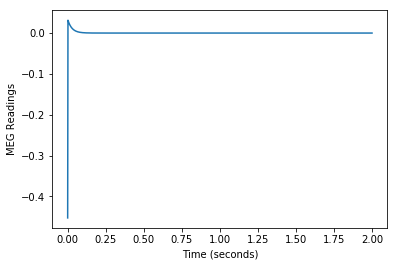

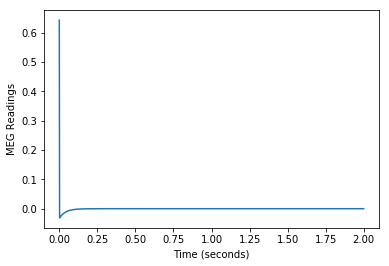

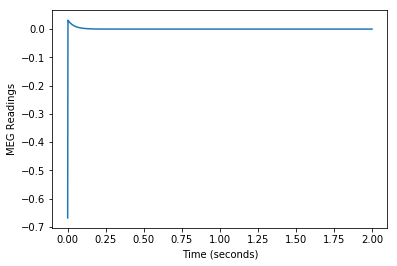

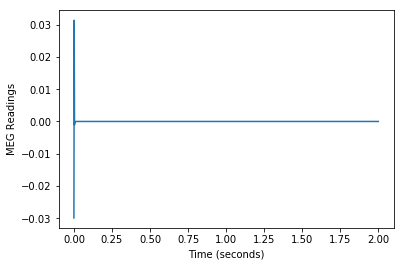

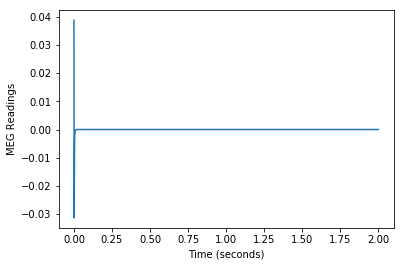

...

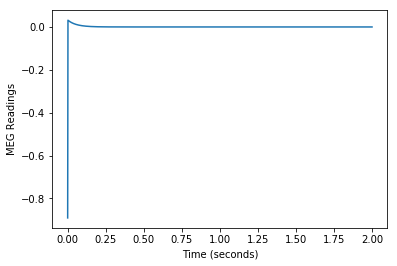

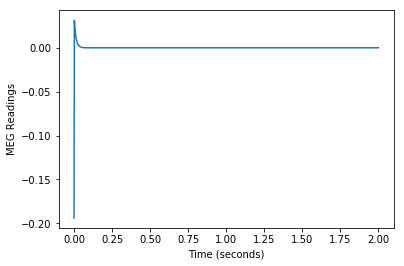

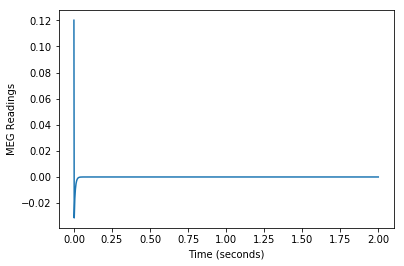

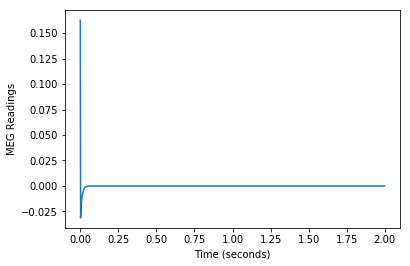

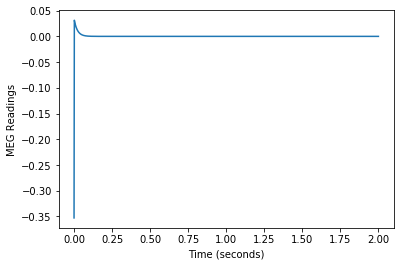

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline

for i in range(len(data_trials[0][0])):
    plt.plot(data_times[0][0][0], x[i])
    plt.xlabel('Time (seconds)')
    plt.ylabel('MEG Readings')
    plt.show()

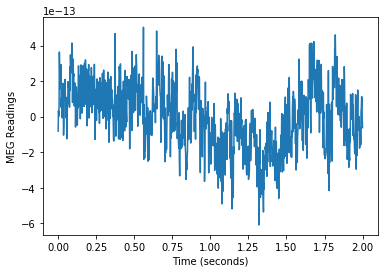

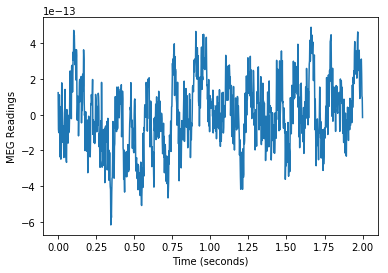

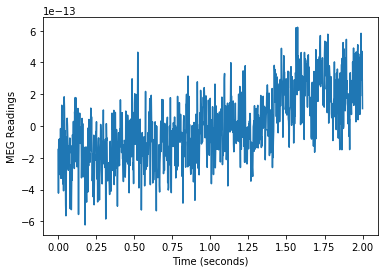

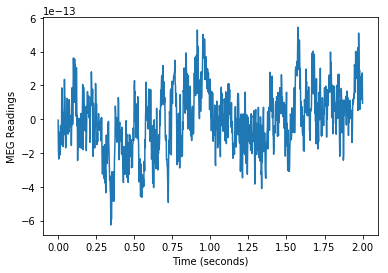

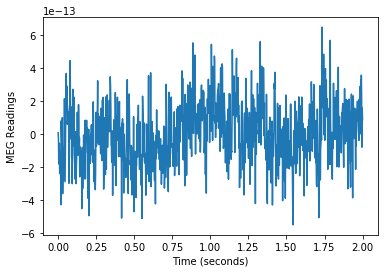

...

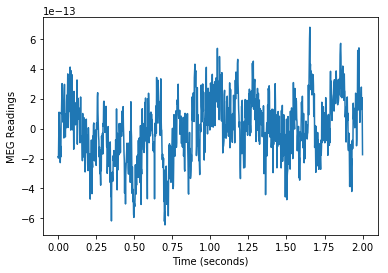

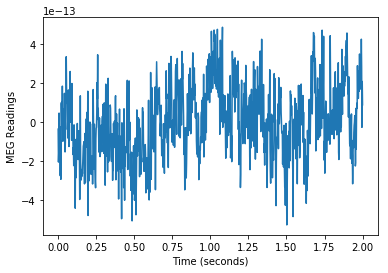

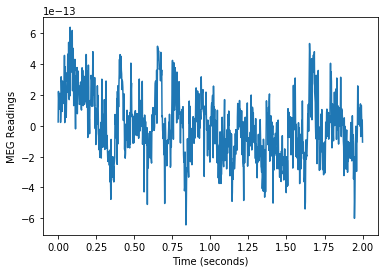

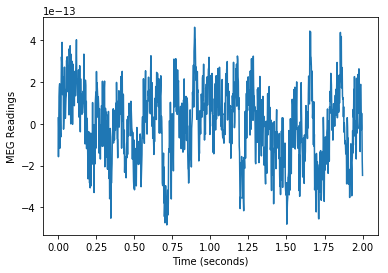

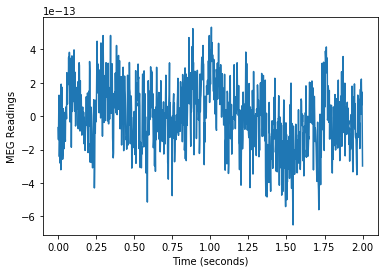

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

for i in range(len(data_trials[0][0])):
    plt.plot(data_times[0][0][0], x[i])
    plt.xlabel('Time (seconds)')
    plt.ylabel('MEG Readings')
    plt.show()

In [3]:
train_frac = 0.8
n_seconds = x.shape[1] #-1 to account for when t=n
t = np.arange(n_seconds)
split = int(n_seconds * train_frac)
t_train, t_test = t[:split], t[split:]
l = float(len(t_train)-1)
t_train1, t_train2 = t_train[:-1], t_train[1:]
t_test1, t_test2 = t_test[:-1], t_test[1:]

In [4]:
def fit(i, iters=500, atol=1e-8):
    x = data_trials[0][0]
    for i in range(x.shape[0]):
        for j in range(len(x[i])):
            x[i,j] = (x[i,j]-np.mean(x[i]))/np.std(x[i])
    y = x[i,1:]-x[i,:-1]

    x_train = x[:, t_train]
    x_train1, x_test1 = x[:,t_train1], x[:,t_test1]

    s = np.sign((y[t_train1]))
    c = np.cov(x_train)
#     c = np.cov(x_train1)

    x0 = (x_train1 - x_train.mean(1)[:, np.newaxis]) / l

    w = np.zeros(x.shape[0]) #272 channels
    w[0] = 1

    erf_last = np.inf
    e = []
#     d = []

    for it in range(iters):
        h = w.dot(x_train1)
        
        sig = np.std(y[t_train1] - w.dot(x[:, t_train1]))
        
        erf_next = erf(h/(np.sqrt(2)*sig))
#         d.append(np.linalg.norm(y[t_train2]-h/np.sqrt(2))**2)
        ei = np.linalg.norm(erf_next - erf_last) 
        e.append(ei)
        if ei * ei < atol:
            break
        erf_last = erf_next.copy()

        h *= s / erf_next
        
        w = solve(c, x0.dot(h))
    return w, e

In [5]:
res = [fit(i) for i in range(x.shape[0])]
w = np.vstack([r[0] for r in res])
e = [r[1] for r in res]

# import pickle
# with open('e.pkl', 'wb') as f:
#      pickle.dump(e, f)
# f.close()

# fileObject = open('w.pkl','rb')  
# w = pickle.load(fileObject) 
# fileObject = open('e.pkl','rb')  
# e = pickle.load(fileObject) 

# fig, ax = plt.subplots(1, 1, figsize=(4,4))
# for ei in d[:5]:
#     ei = ei[1:]
#     ax.plot(ei, 'k-', lw=0.1)
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.set_xlabel('iteration')
# ax.set_ylabel('discrepancy')
# plt.tight_layout()
# plt.show()

c:\users\jeffrey young\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:39: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.084651e-20


In [6]:
temp = x.shape[0]
train_prediction = np.empty((temp, len(t_train2)))
test_prediction = np.empty((temp, len(t_test2)))
arr = []

for i in range(temp-1): #num of channels
    y = x[i,1:]-x[i,:-1]
    train_prediction[i] = w[i].dot(x[:,t_train1]) + np.mean(y[t_train1] - w[i].dot(x[:,t_train1]))
    test_prediction[i] = w[i].dot(x[:,t_test1]) + np.mean(y[t_train1] - w[i].dot(x[:,t_train1]))
    arr.append(np.mean(y[t_train1] - w[i].dot(x[:,t_train1])))
#     train_prediction[i] = x[i, t_train1] + w[i].dot(x[:,t_train1])
#     test_prediction[i] = x[i, t_test1] + w[i].dot(x[:,t_test1])

    train_prediction[i][train_prediction[i] < 0] = 0
    test_prediction[i][test_prediction[i] < 0] = 0
    train_prediction[i][train_prediction[i] > 1] = 1
    test_prediction[i][test_prediction[i] > 1] = 1

In [12]:
fig, ax = plt.subplots(x.shape[0], 1, figsize=(14, 2*x.shape[0]))
for i in range (x.shape[0]):
    ax[i].plot(t_train2, train_prediction[i], 'b-',
               t_test2, test_prediction[i], 'r-',
               t, x[i], 'k-', clip_on=False)
plt.show()

KeyboardInterrupt: 

1 MEG Readings for Sensor  ['A22']


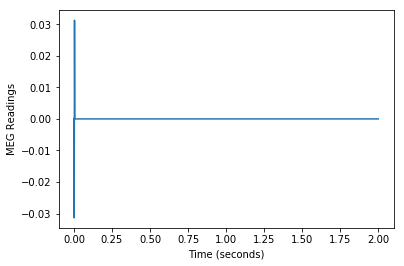

2 MEG Readings for Sensor  ['A104']


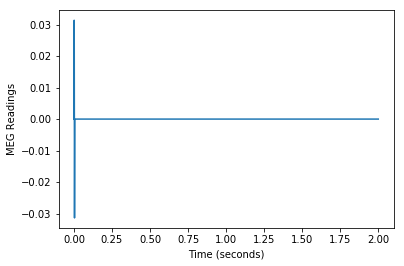

3 MEG Readings for Sensor  ['A241']


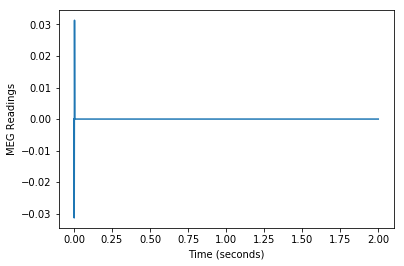

4 MEG Readings for Sensor  ['A138']


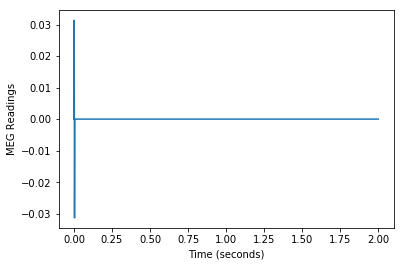

5 MEG Readings for Sensor  ['A214']


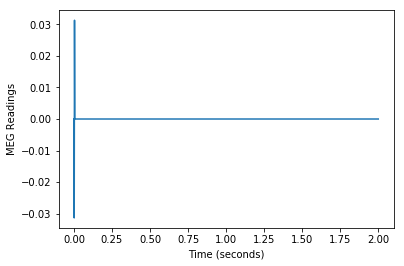

6 MEG Readings for Sensor  ['A71']


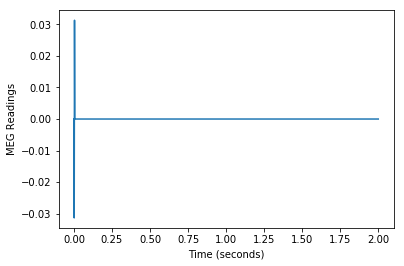

7 MEG Readings for Sensor  ['A26']


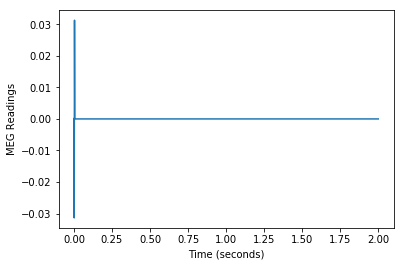

8 MEG Readings for Sensor  ['A93']


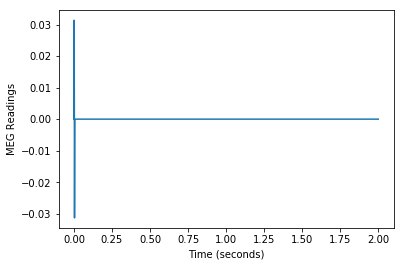

9 MEG Readings for Sensor  ['A39']


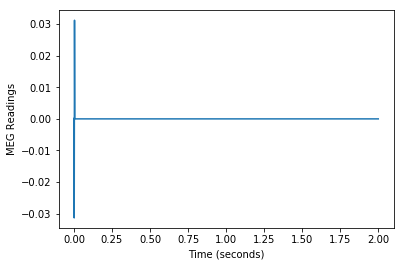

10 MEG Readings for Sensor  ['A125']


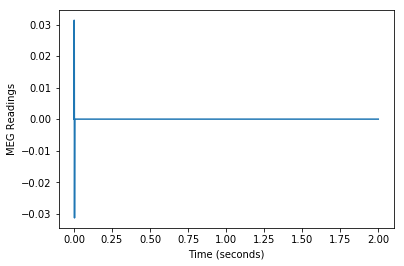

11 MEG Readings for Sensor  ['A20']


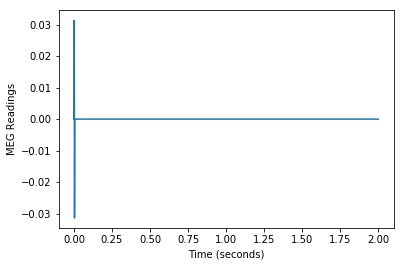

12 MEG Readings for Sensor  ['A65']


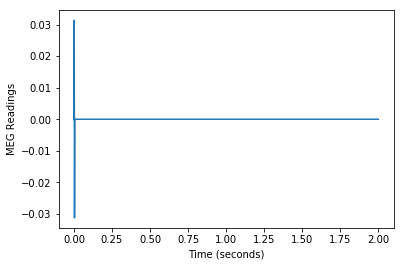

13 MEG Readings for Sensor  ['A9']


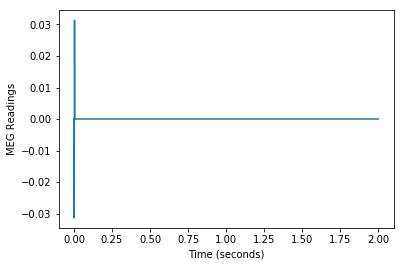

14 MEG Readings for Sensor  ['A95']


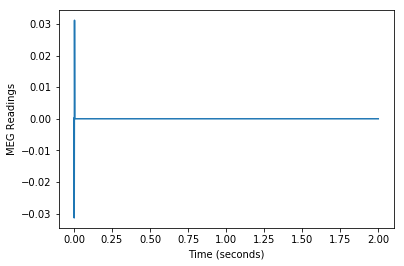

15 MEG Readings for Sensor  ['A114']


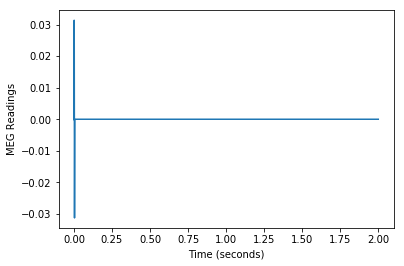

16 MEG Readings for Sensor  ['A175']


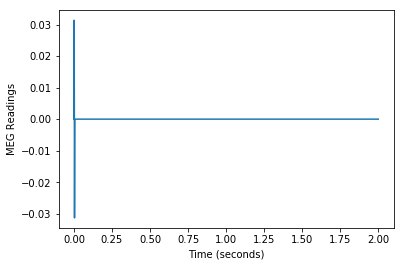

17 MEG Readings for Sensor  ['A16']


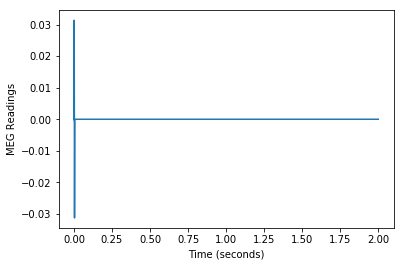

18 MEG Readings for Sensor  ['A228']


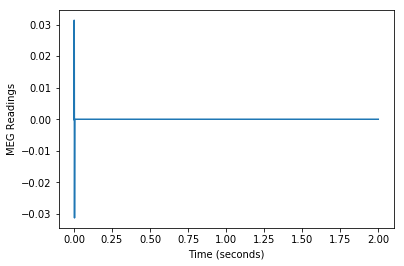

19 MEG Readings for Sensor  ['A35']


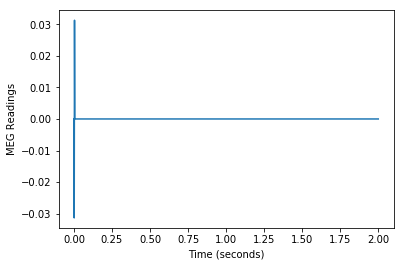

20 MEG Readings for Sensor  ['A191']


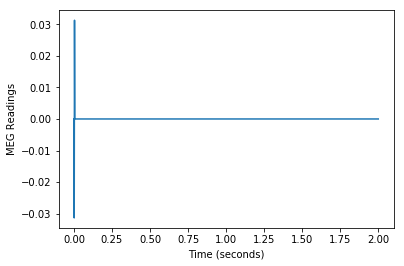

21 MEG Readings for Sensor  ['A37']


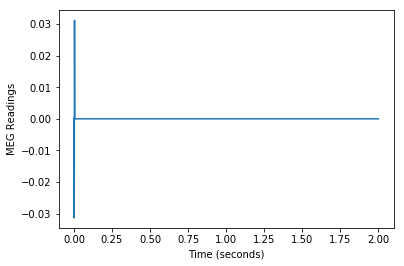

22 MEG Readings for Sensor  ['A170']


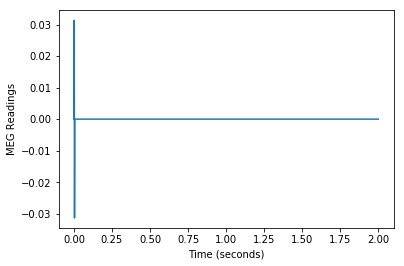

23 MEG Readings for Sensor  ['A207']


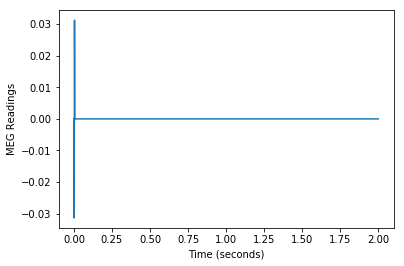

24 MEG Readings for Sensor  ['A224']


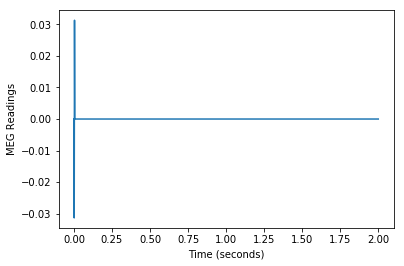

25 MEG Readings for Sensor  ['A82']


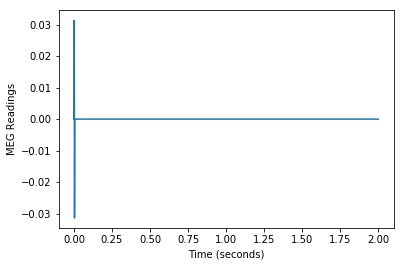

26 MEG Readings for Sensor  ['A238']


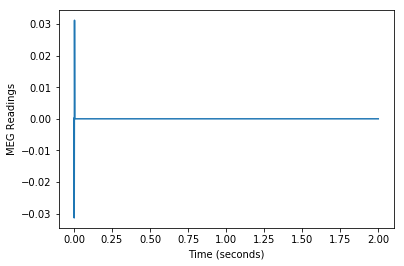

27 MEG Readings for Sensor  ['A202']


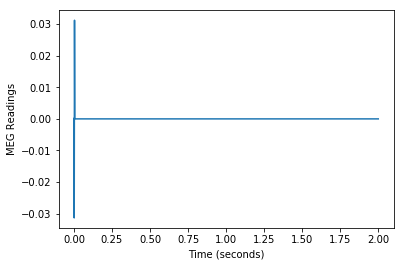

28 MEG Readings for Sensor  ['A220']


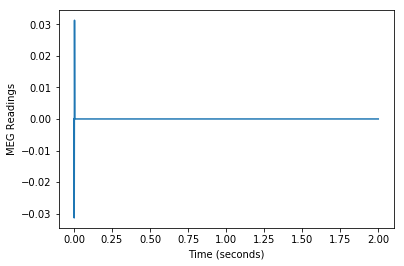

29 MEG Readings for Sensor  ['A28']


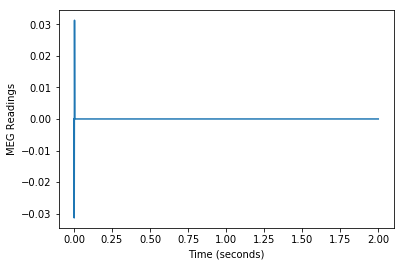

30 MEG Readings for Sensor  ['A239']


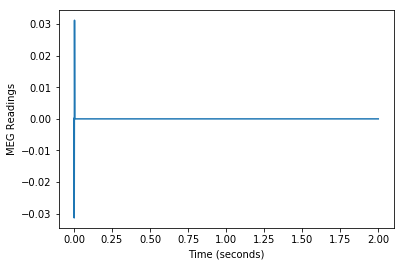

31 MEG Readings for Sensor  ['A13']


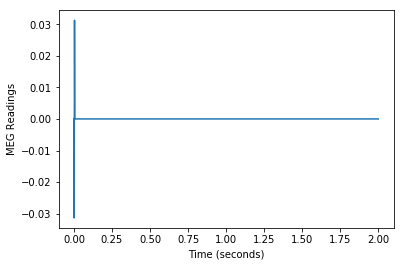

32 MEG Readings for Sensor  ['A165']


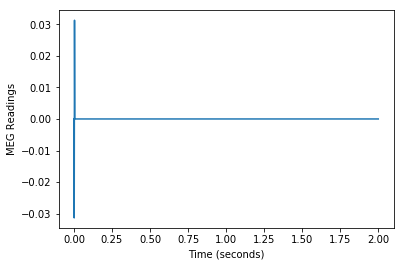

33 MEG Readings for Sensor  ['A204']


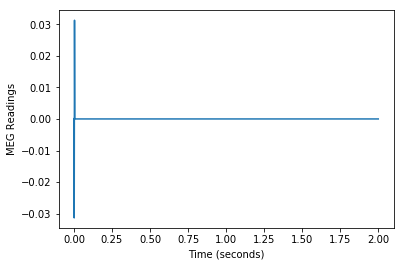

34 MEG Readings for Sensor  ['A233']


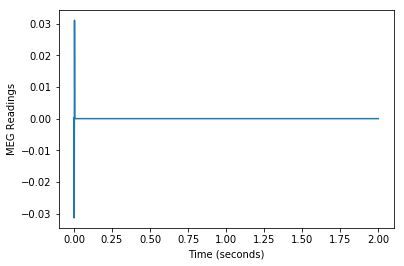

35 MEG Readings for Sensor  ['A98']


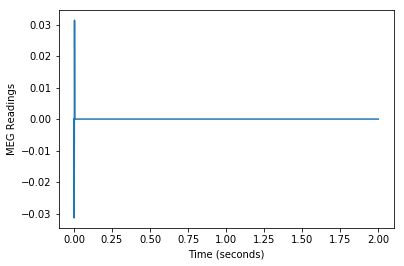

36 MEG Readings for Sensor  ['A25']


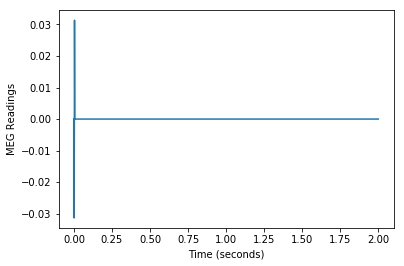

37 MEG Readings for Sensor  ['A70']


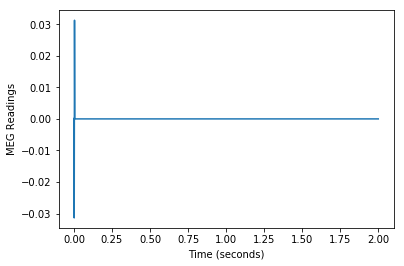

38 MEG Readings for Sensor  ['A72']


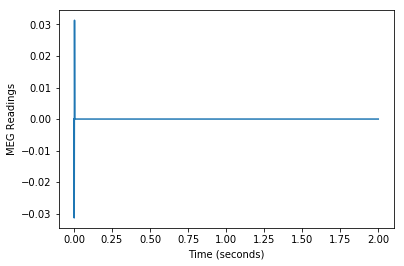

39 MEG Readings for Sensor  ['A11']


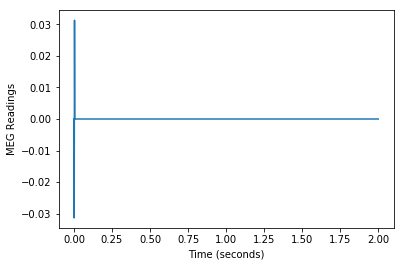

40 MEG Readings for Sensor  ['A47']


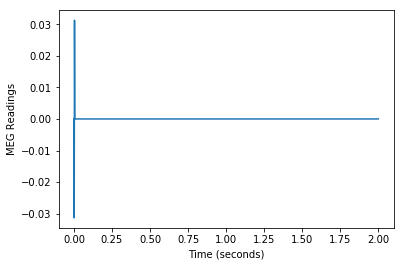

41 MEG Readings for Sensor  ['A160']


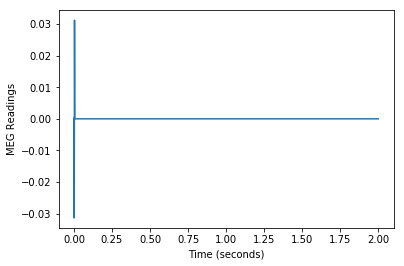

42 MEG Readings for Sensor  ['A64']


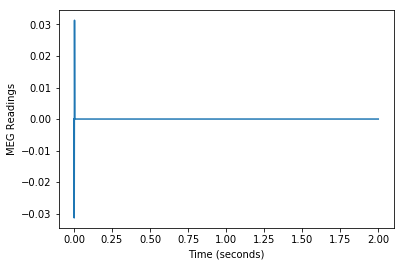

43 MEG Readings for Sensor  ['A3']


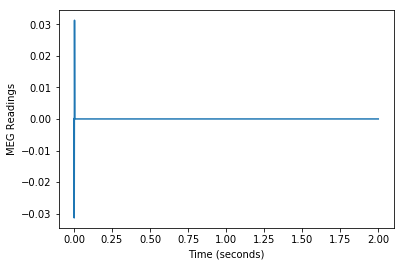

44 MEG Readings for Sensor  ['A177']


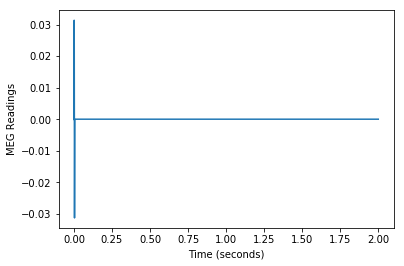

45 MEG Readings for Sensor  ['A63']


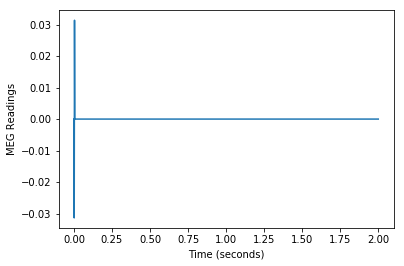

46 MEG Readings for Sensor  ['A155']


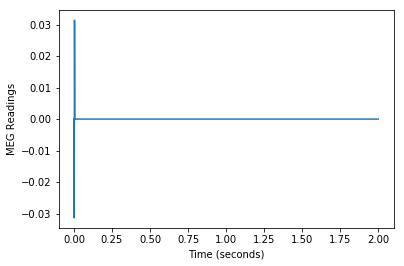

47 MEG Readings for Sensor  ['A10']


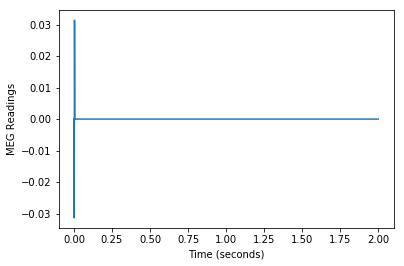

48 MEG Readings for Sensor  ['A127']


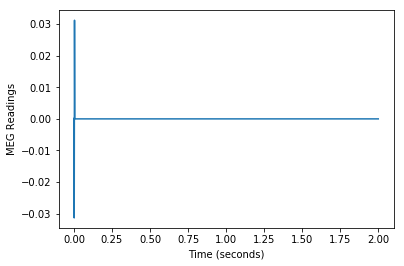

49 MEG Readings for Sensor  ['A67']


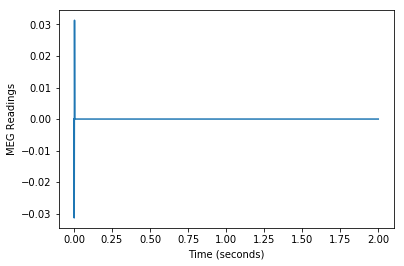

50 MEG Readings for Sensor  ['A115']


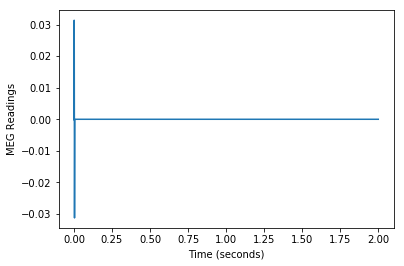

51 MEG Readings for Sensor  ['A247']


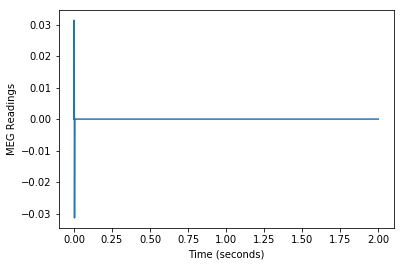

52 MEG Readings for Sensor  ['A174']


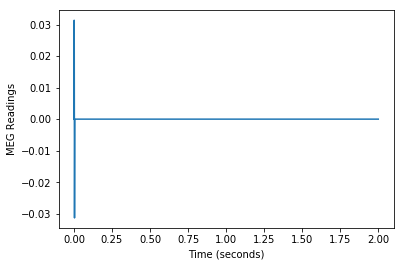

53 MEG Readings for Sensor  ['A194']


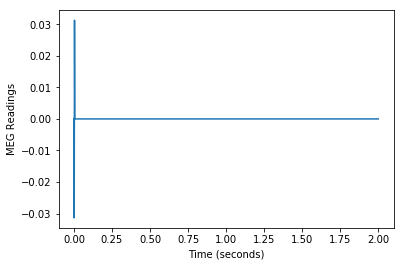

54 MEG Readings for Sensor  ['A5']


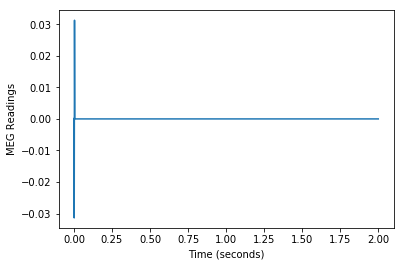

55 MEG Readings for Sensor  ['A242']


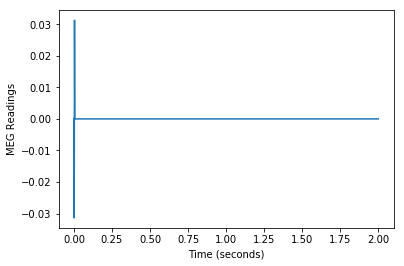

56 MEG Readings for Sensor  ['A176']


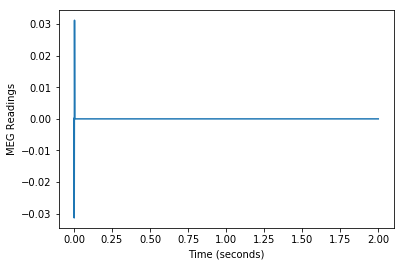

57 MEG Readings for Sensor  ['A78']


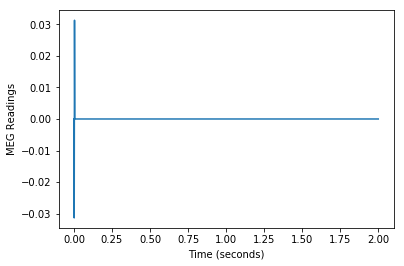

58 MEG Readings for Sensor  ['A168']


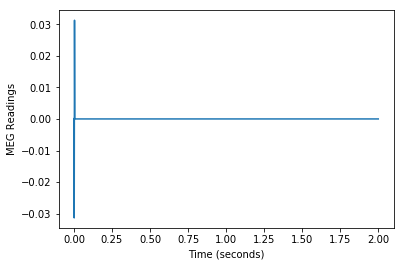

59 MEG Readings for Sensor  ['A31']


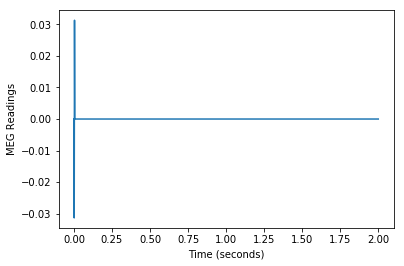

60 MEG Readings for Sensor  ['A223']


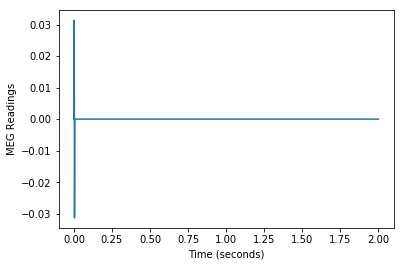

61 MEG Readings for Sensor  ['A245']


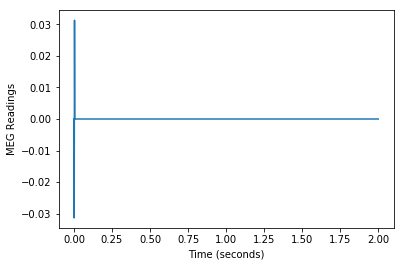

62 MEG Readings for Sensor  ['A219']


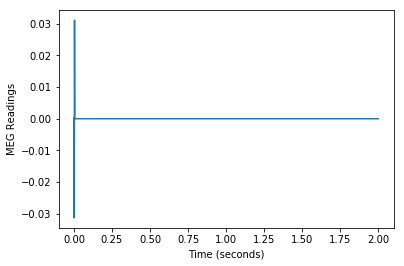

63 MEG Readings for Sensor  ['A12']


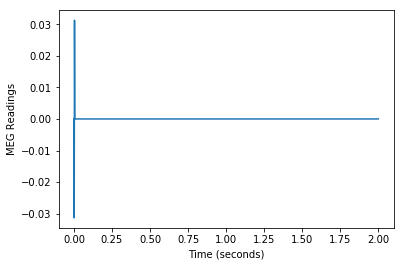

64 MEG Readings for Sensor  ['A186']


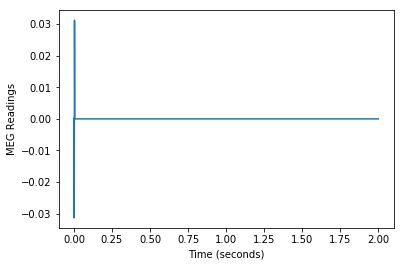

65 MEG Readings for Sensor  ['A105']


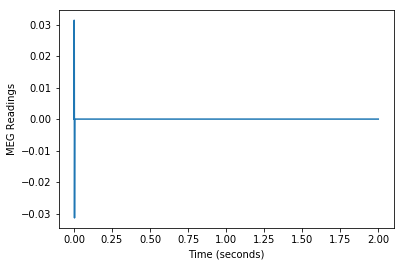

66 MEG Readings for Sensor  ['A222']


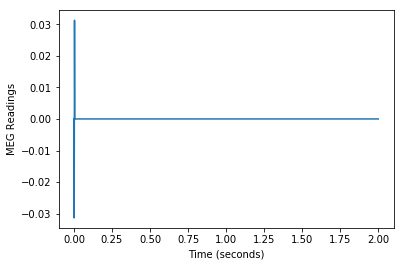

67 MEG Readings for Sensor  ['A76']


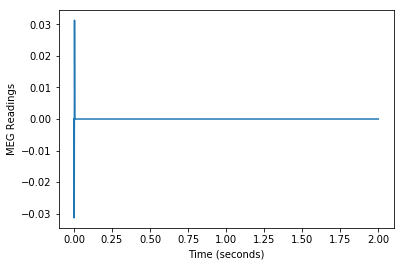

68 MEG Readings for Sensor  ['A50']


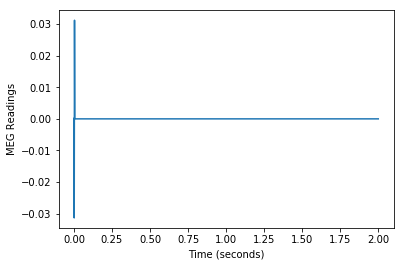

69 MEG Readings for Sensor  ['A188']


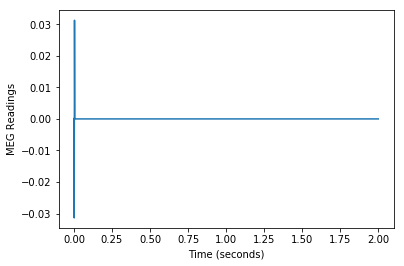

70 MEG Readings for Sensor  ['A231']


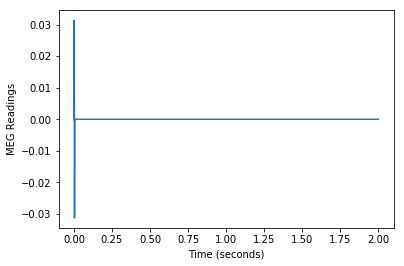

71 MEG Readings for Sensor  ['A45']


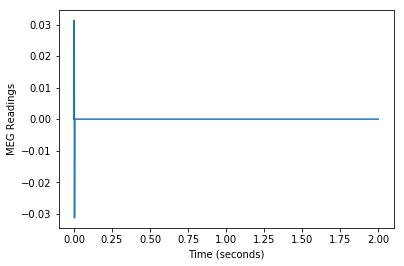

72 MEG Readings for Sensor  ['A180']


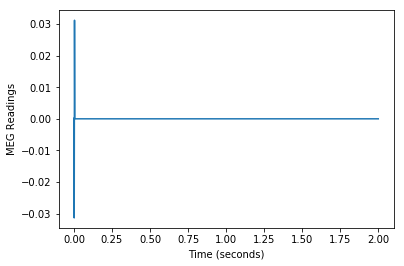

73 MEG Readings for Sensor  ['A99']


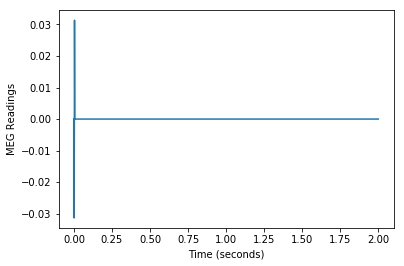

74 MEG Readings for Sensor  ['A234']


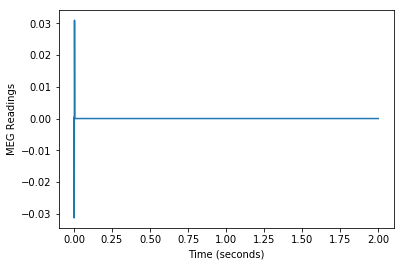

75 MEG Readings for Sensor  ['A215']


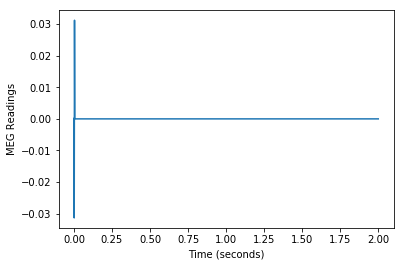

76 MEG Readings for Sensor  ['A235']


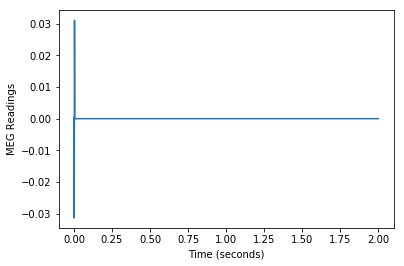

77 MEG Readings for Sensor  ['A181']


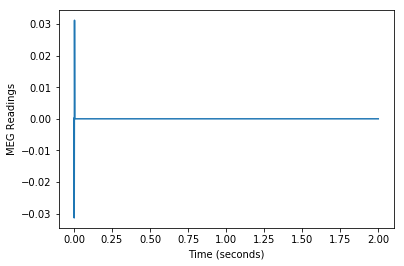

78 MEG Readings for Sensor  ['A38']


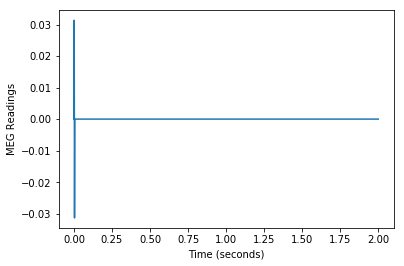

79 MEG Readings for Sensor  ['A230']


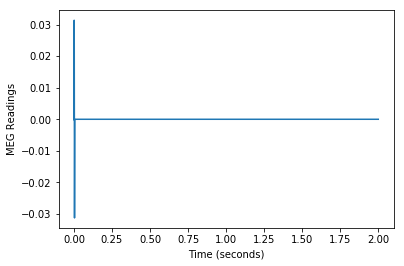

80 MEG Readings for Sensor  ['A91']


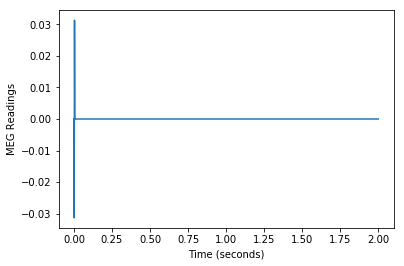

81 MEG Readings for Sensor  ['A212']


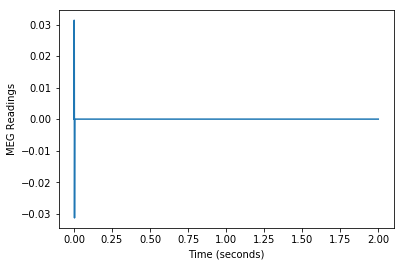

82 MEG Readings for Sensor  ['A24']


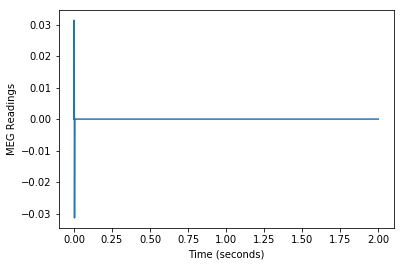

83 MEG Readings for Sensor  ['A66']


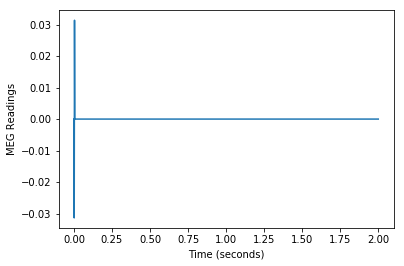

84 MEG Readings for Sensor  ['A42']


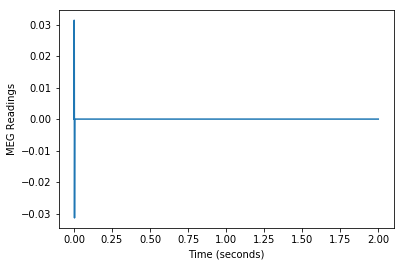

85 MEG Readings for Sensor  ['A96']


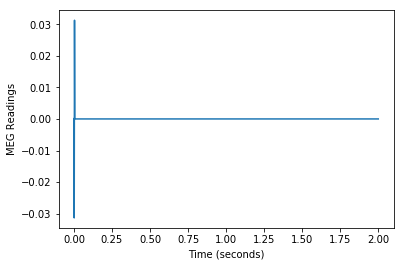

86 MEG Readings for Sensor  ['A57']


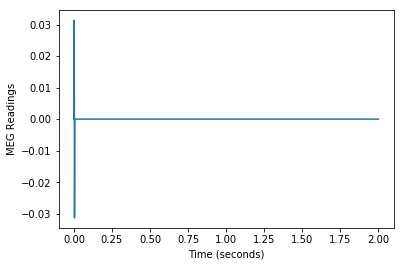

87 MEG Readings for Sensor  ['A86']


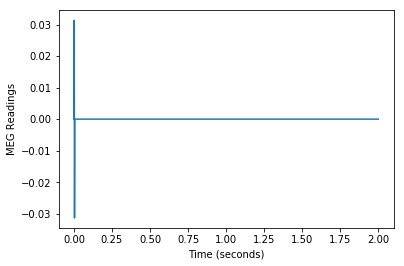

88 MEG Readings for Sensor  ['A56']


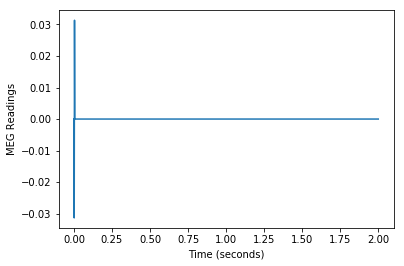

89 MEG Readings for Sensor  ['A116']


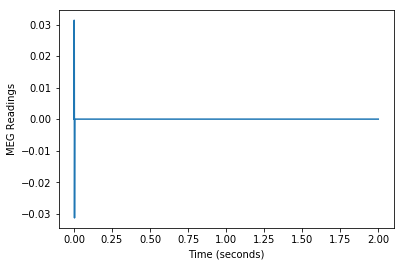

90 MEG Readings for Sensor  ['A151']


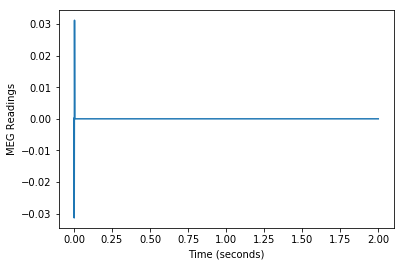

91 MEG Readings for Sensor  ['A141']


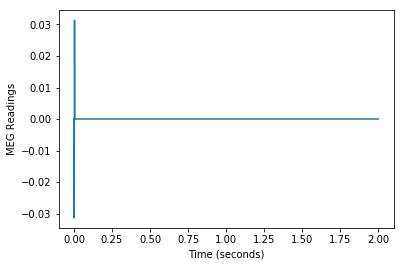

92 MEG Readings for Sensor  ['A120']


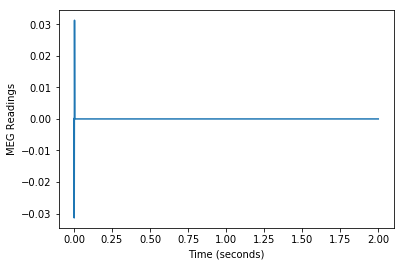

93 MEG Readings for Sensor  ['A189']


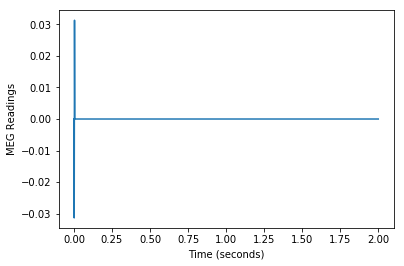

94 MEG Readings for Sensor  ['A80']


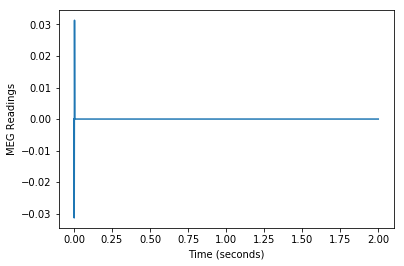

95 MEG Readings for Sensor  ['A143']


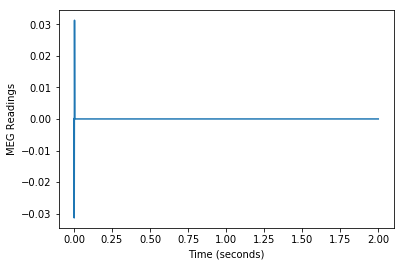

96 MEG Readings for Sensor  ['A113']


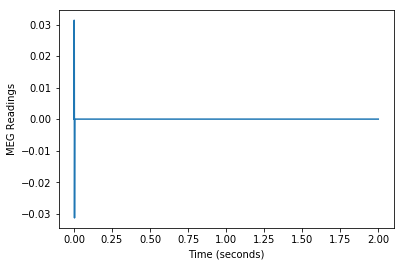

97 MEG Readings for Sensor  ['A27']


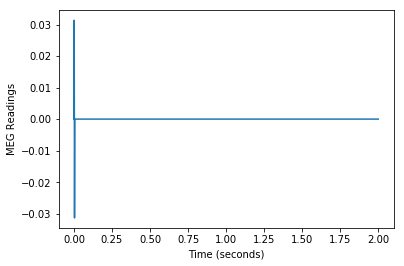

98 MEG Readings for Sensor  ['A137']


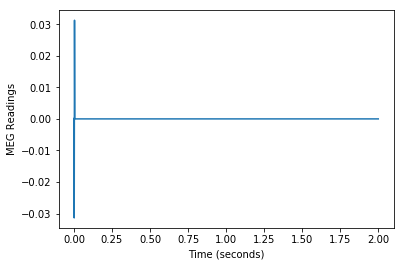

99 MEG Readings for Sensor  ['A135']


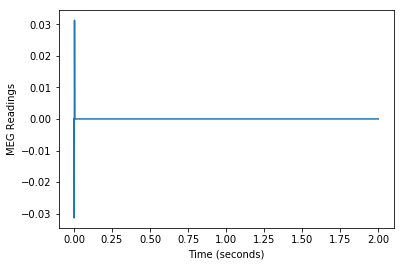

100 MEG Readings for Sensor  ['A167']


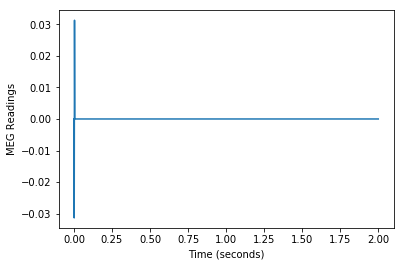

101 MEG Readings for Sensor  ['A75']


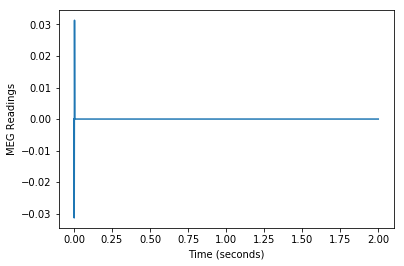

102 MEG Readings for Sensor  ['A240']


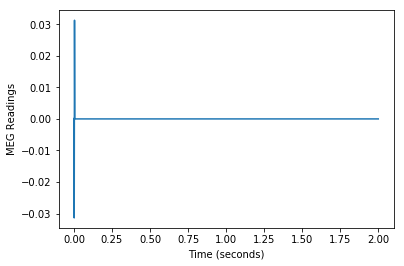

103 MEG Readings for Sensor  ['A206']


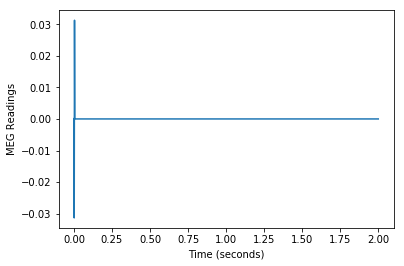

104 MEG Readings for Sensor  ['A107']


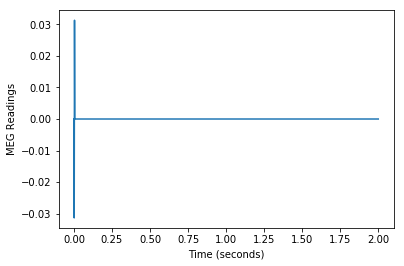

105 MEG Readings for Sensor  ['A130']


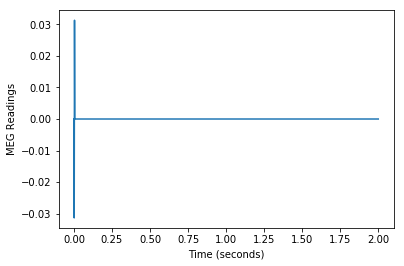

106 MEG Readings for Sensor  ['A100']


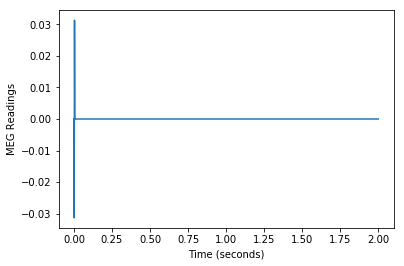

107 MEG Readings for Sensor  ['A43']


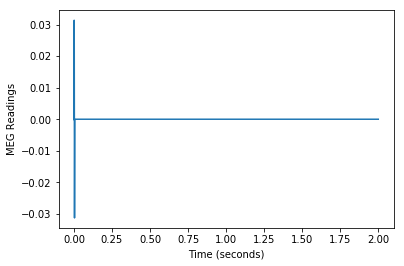

108 MEG Readings for Sensor  ['A200']


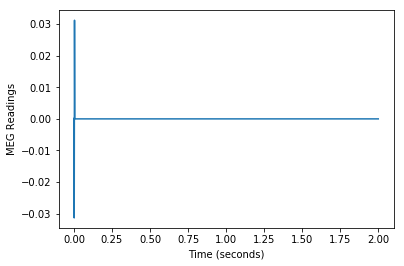

109 MEG Readings for Sensor  ['A102']


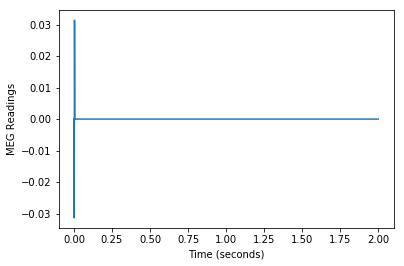

110 MEG Readings for Sensor  ['A132']


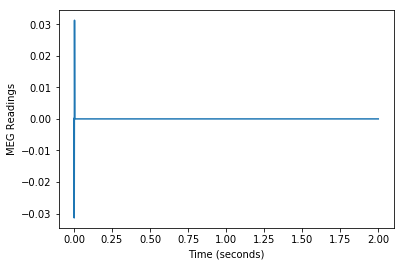

111 MEG Readings for Sensor  ['A183']


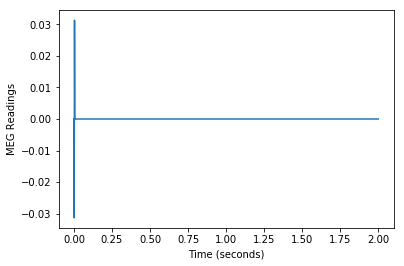

112 MEG Readings for Sensor  ['A199']


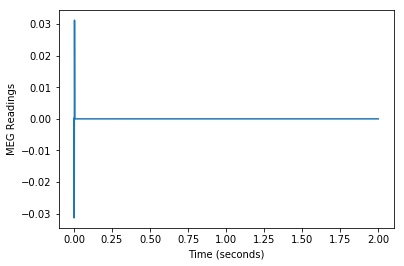

113 MEG Readings for Sensor  ['A122']


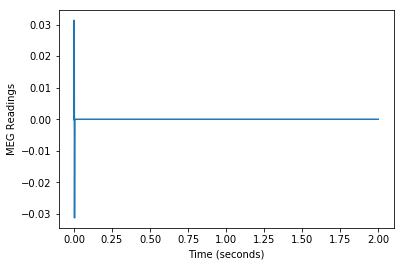

114 MEG Readings for Sensor  ['A19']


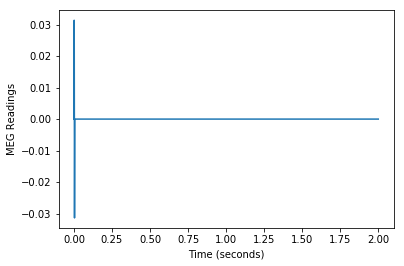

115 MEG Readings for Sensor  ['A62']


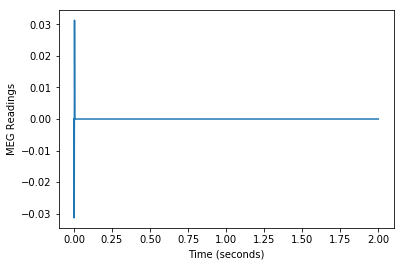

116 MEG Readings for Sensor  ['A21']


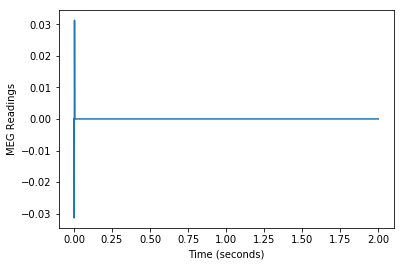

117 MEG Readings for Sensor  ['A229']


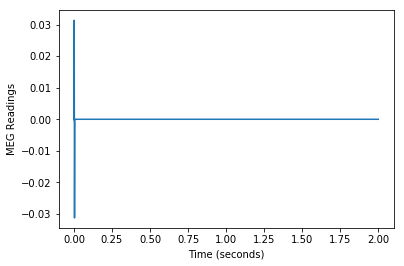

118 MEG Readings for Sensor  ['A84']


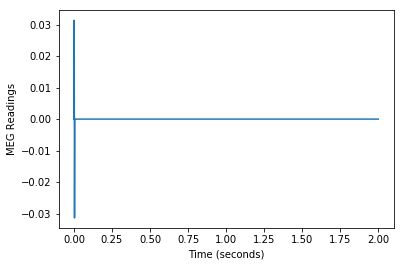

119 MEG Readings for Sensor  ['A213']


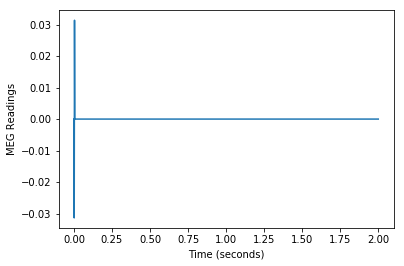

120 MEG Readings for Sensor  ['A55']


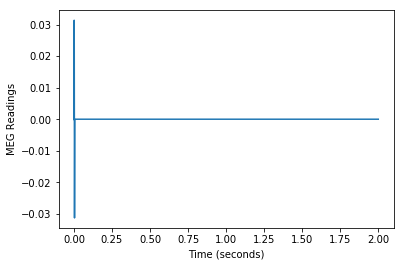

121 MEG Readings for Sensor  ['A32']


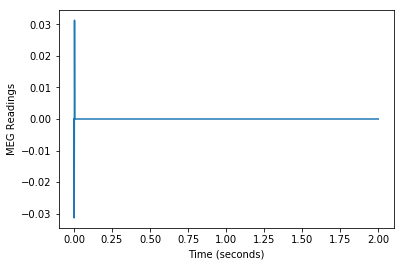

122 MEG Readings for Sensor  ['A85']


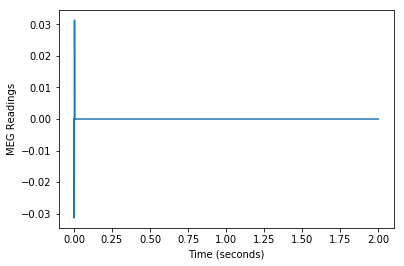

123 MEG Readings for Sensor  ['A146']


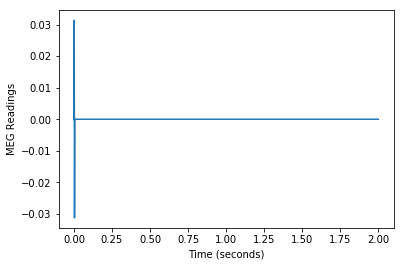

124 MEG Readings for Sensor  ['A58']


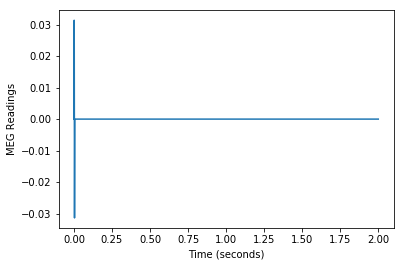

125 MEG Readings for Sensor  ['A60']


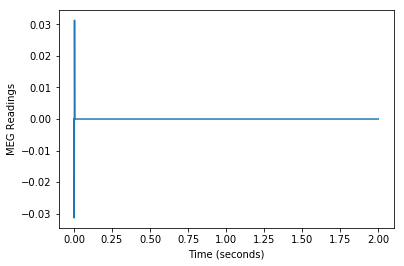

126 MEG Readings for Sensor  ['A88']


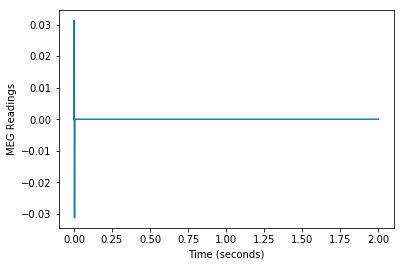

127 MEG Readings for Sensor  ['A79']


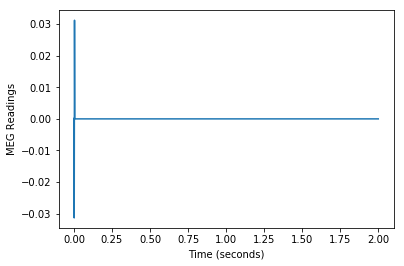

128 MEG Readings for Sensor  ['A169']


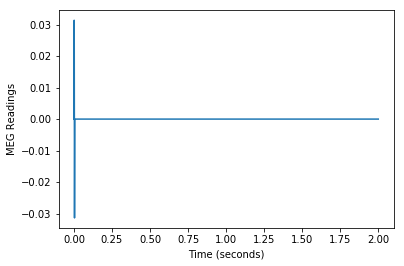

129 MEG Readings for Sensor  ['A54']


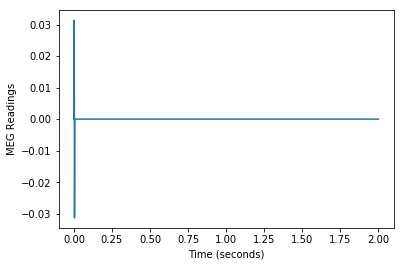

130 MEG Readings for Sensor  ['A203']


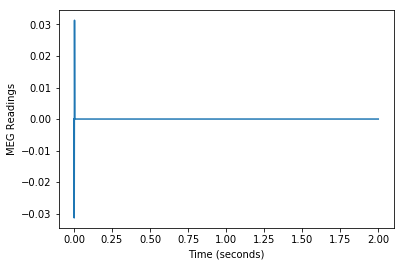

131 MEG Readings for Sensor  ['A145']


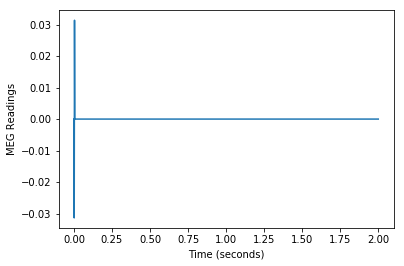

132 MEG Readings for Sensor  ['A103']


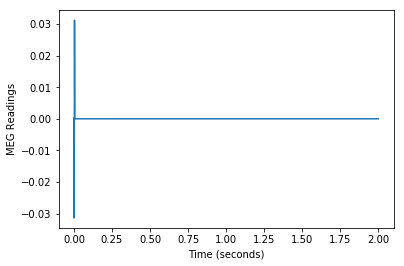

133 MEG Readings for Sensor  ['A163']


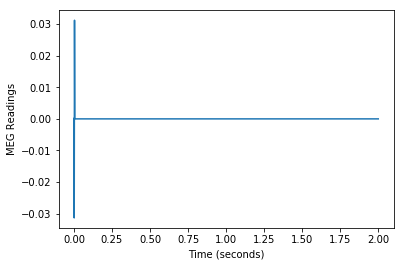

134 MEG Readings for Sensor  ['A139']


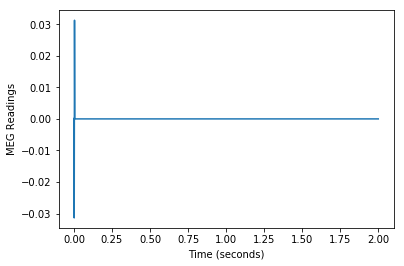

135 MEG Readings for Sensor  ['A49']


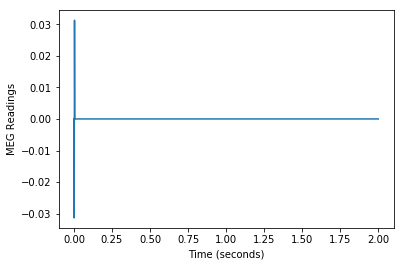

136 MEG Readings for Sensor  ['A166']


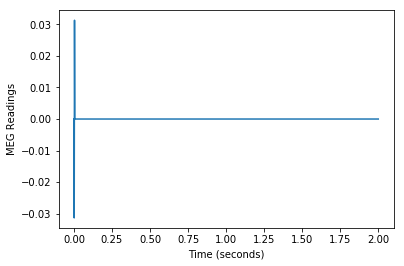

137 MEG Readings for Sensor  ['A156']


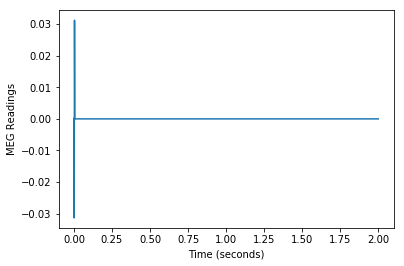

138 MEG Readings for Sensor  ['A128']


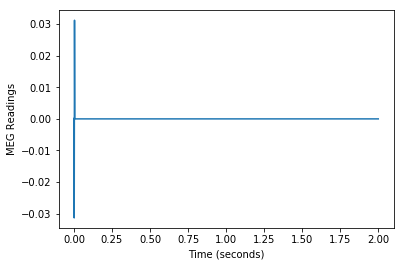

139 MEG Readings for Sensor  ['A68']


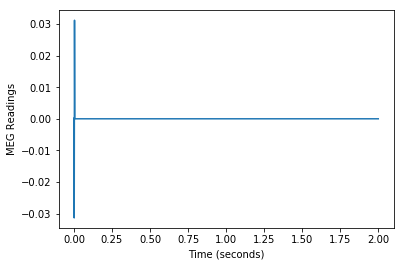

140 MEG Readings for Sensor  ['A159']


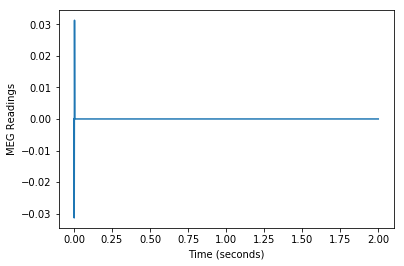

141 MEG Readings for Sensor  ['A236']


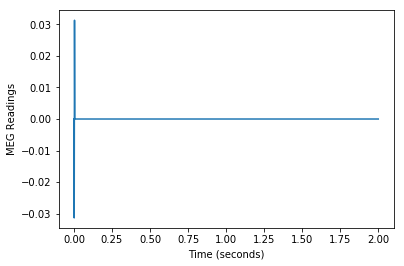

142 MEG Readings for Sensor  ['A161']


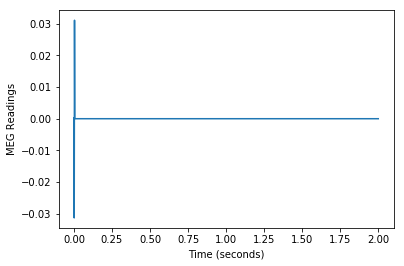

143 MEG Readings for Sensor  ['A121']


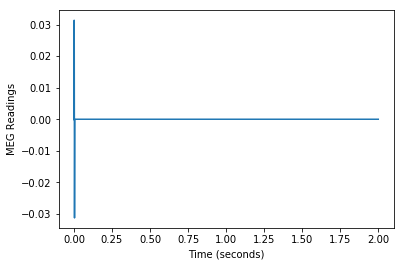

144 MEG Readings for Sensor  ['A4']


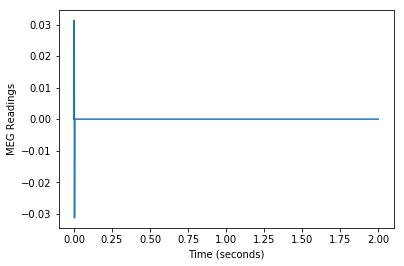

145 MEG Readings for Sensor  ['A61']


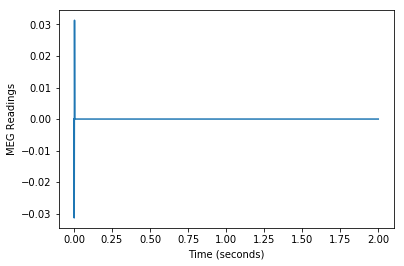

146 MEG Readings for Sensor  ['A6']


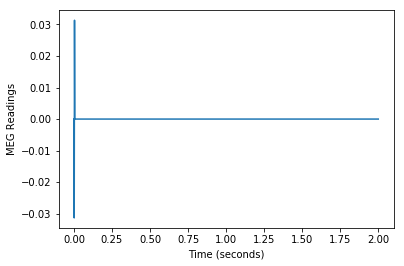

147 MEG Readings for Sensor  ['A14']


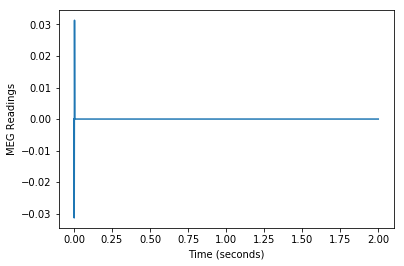

148 MEG Readings for Sensor  ['A94']


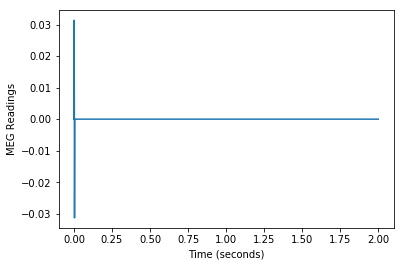

149 MEG Readings for Sensor  ['A15']


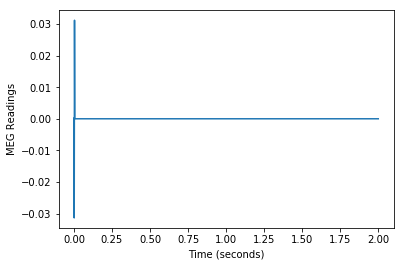

150 MEG Readings for Sensor  ['A193']


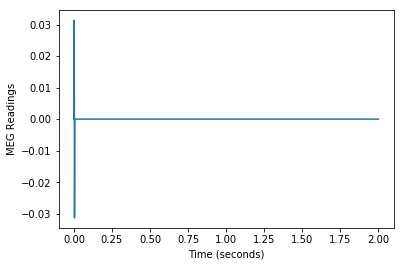

151 MEG Readings for Sensor  ['A150']


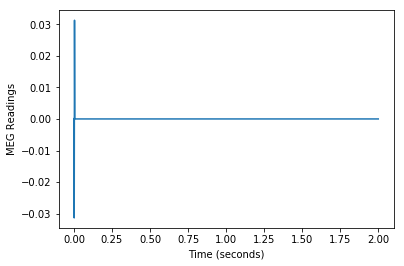

152 MEG Readings for Sensor  ['A227']


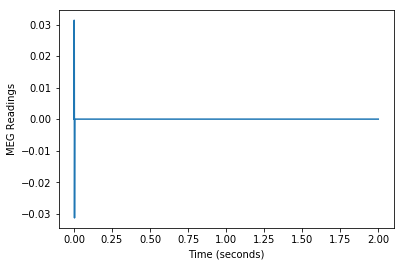

153 MEG Readings for Sensor  ['A59']


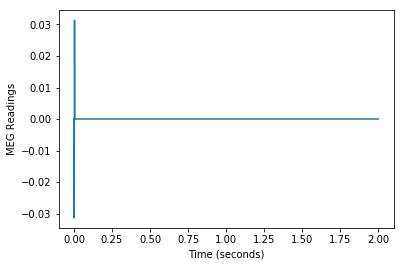

154 MEG Readings for Sensor  ['A36']


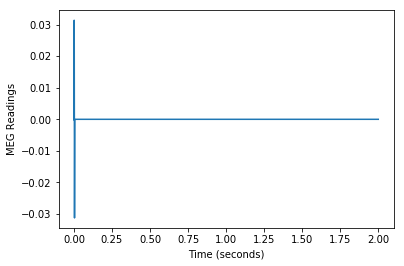

155 MEG Readings for Sensor  ['A225']


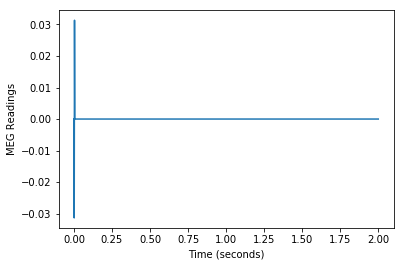

156 MEG Readings for Sensor  ['A195']


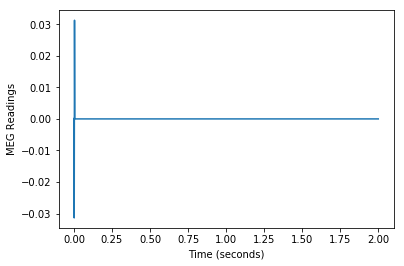

157 MEG Readings for Sensor  ['A30']


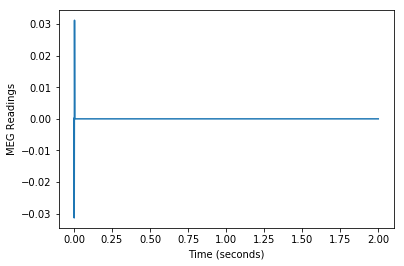

158 MEG Readings for Sensor  ['A109']


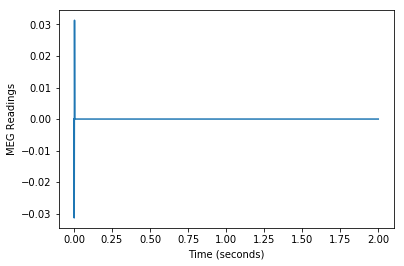

159 MEG Readings for Sensor  ['A172']


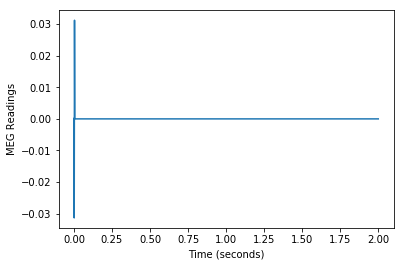

160 MEG Readings for Sensor  ['A108']


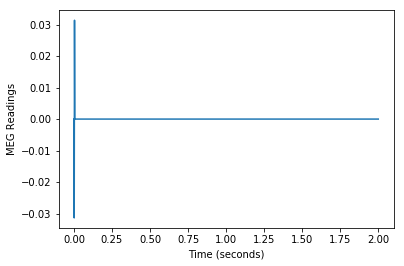

161 MEG Readings for Sensor  ['A81']


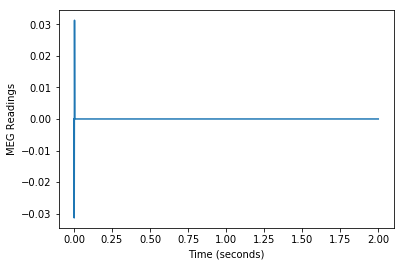

162 MEG Readings for Sensor  ['A171']


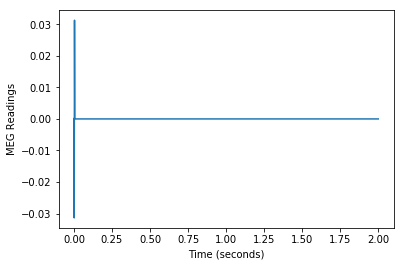

163 MEG Readings for Sensor  ['A218']


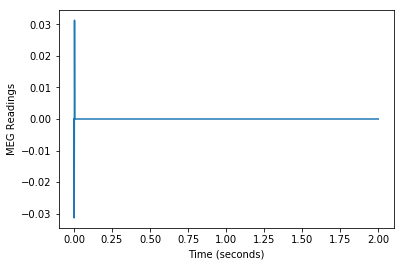

164 MEG Readings for Sensor  ['A173']


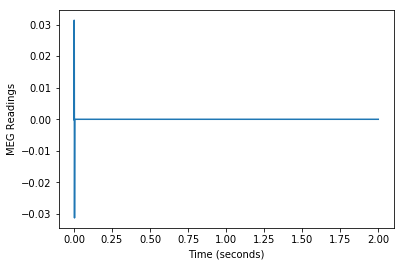

165 MEG Readings for Sensor  ['A201']


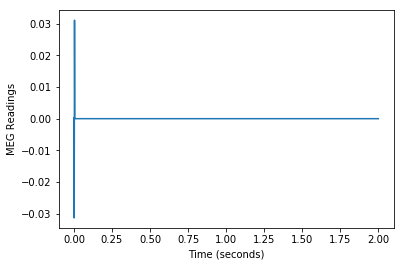

166 MEG Readings for Sensor  ['A74']


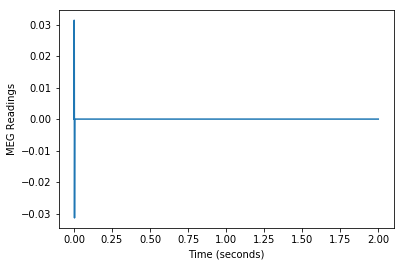

167 MEG Readings for Sensor  ['A29']


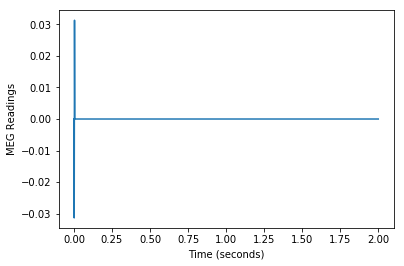

168 MEG Readings for Sensor  ['A164']


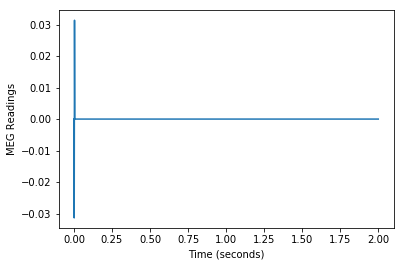

169 MEG Readings for Sensor  ['A205']


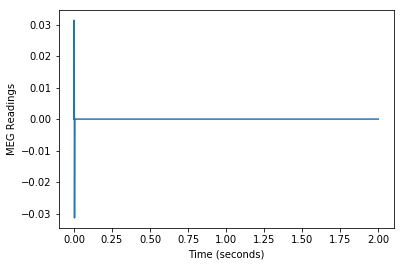

170 MEG Readings for Sensor  ['A69']


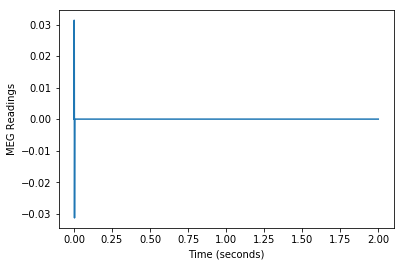

171 MEG Readings for Sensor  ['A157']


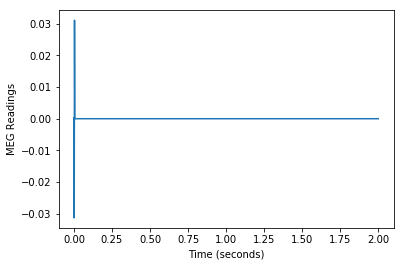

172 MEG Readings for Sensor  ['A97']


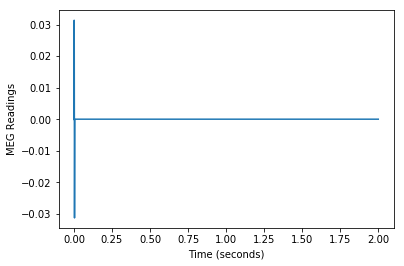

173 MEG Readings for Sensor  ['A217']


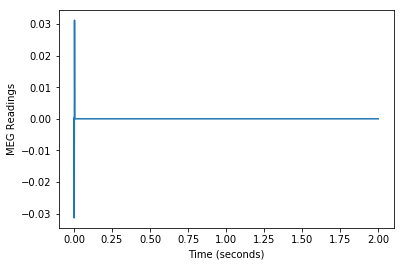

174 MEG Readings for Sensor  ['A101']


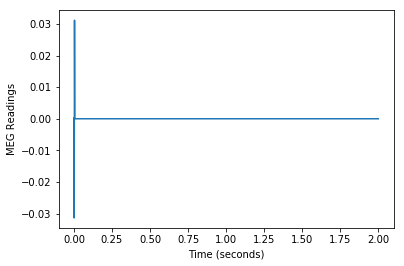

175 MEG Readings for Sensor  ['A124']


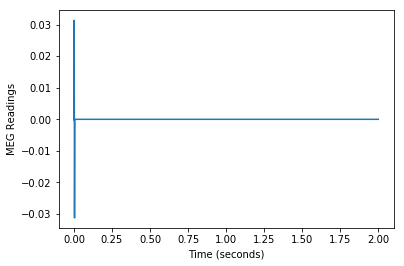

176 MEG Readings for Sensor  ['A40']


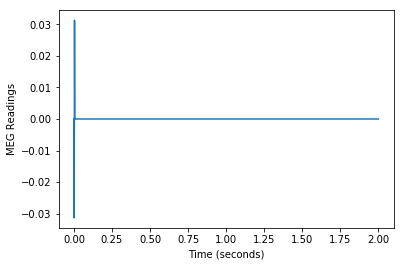

177 MEG Readings for Sensor  ['A123']


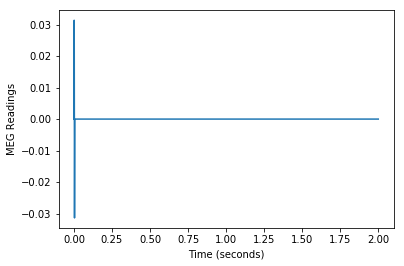

178 MEG Readings for Sensor  ['A153']


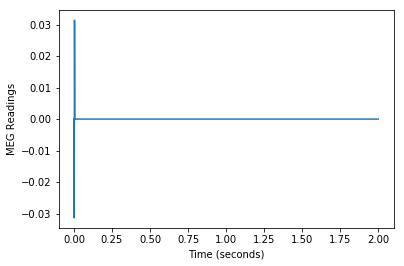

179 MEG Readings for Sensor  ['A178']


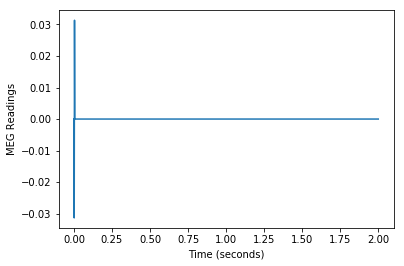

180 MEG Readings for Sensor  ['A1']


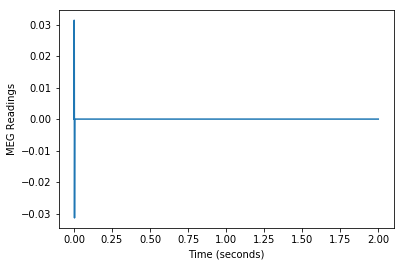

181 MEG Readings for Sensor  ['A179']


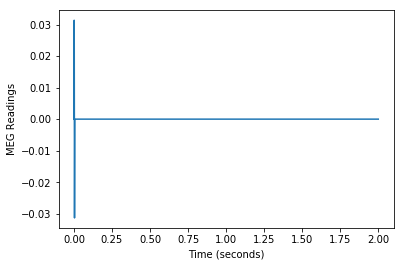

182 MEG Readings for Sensor  ['A33']


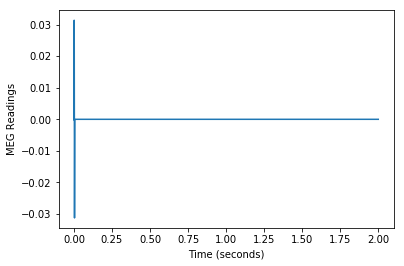

183 MEG Readings for Sensor  ['A147']


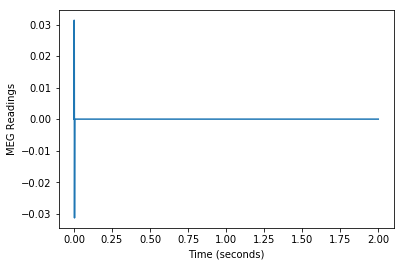

184 MEG Readings for Sensor  ['A117']


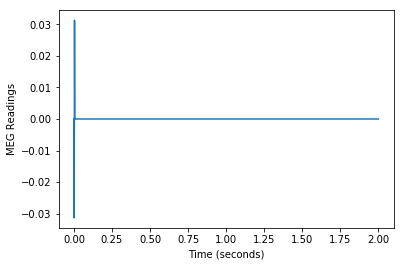

185 MEG Readings for Sensor  ['A148']


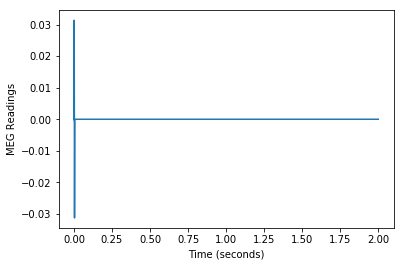

186 MEG Readings for Sensor  ['A87']


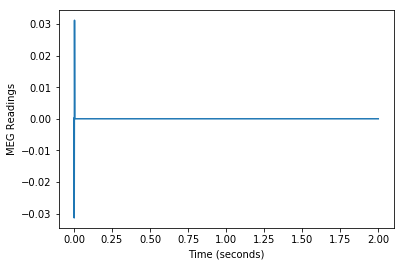

187 MEG Readings for Sensor  ['A89']


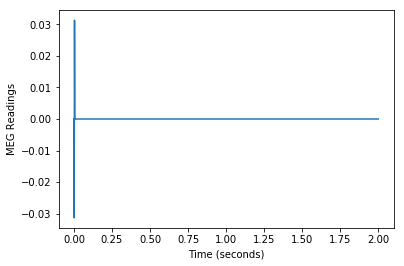

188 MEG Readings for Sensor  ['A243']


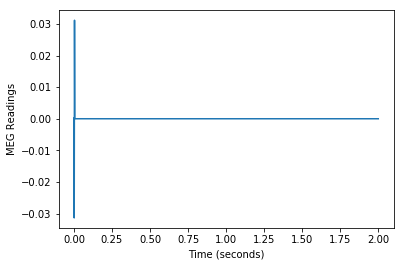

189 MEG Readings for Sensor  ['A119']


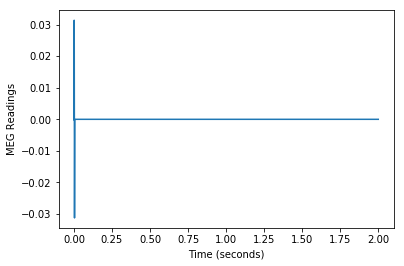

190 MEG Readings for Sensor  ['A52']


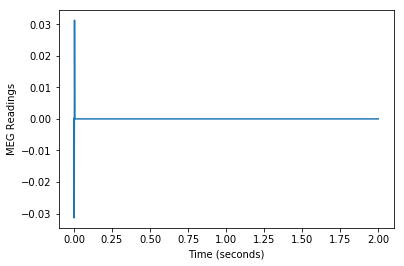

191 MEG Readings for Sensor  ['A142']


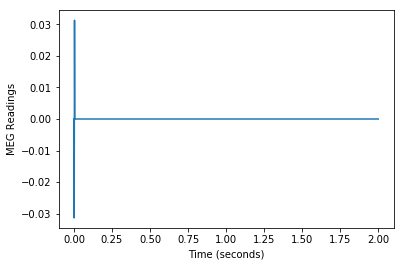

192 MEG Readings for Sensor  ['A211']


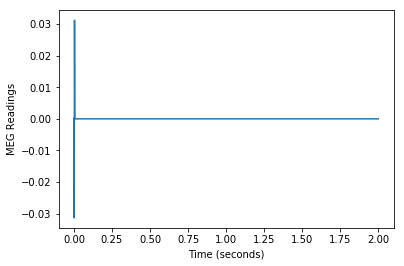

193 MEG Readings for Sensor  ['A190']


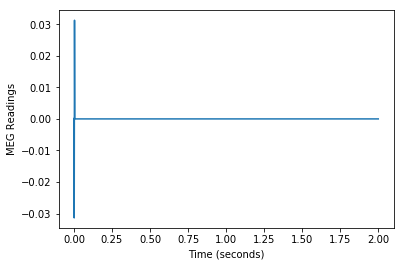

194 MEG Readings for Sensor  ['A53']


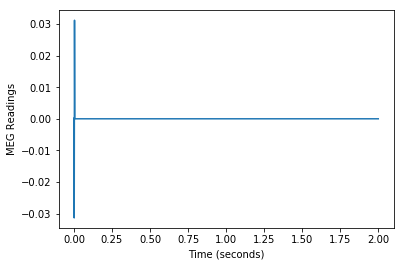

195 MEG Readings for Sensor  ['A192']


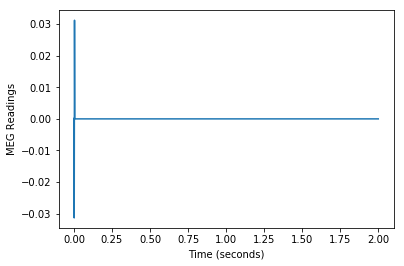

196 MEG Readings for Sensor  ['A73']


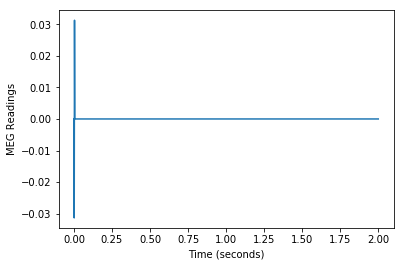

197 MEG Readings for Sensor  ['A226']


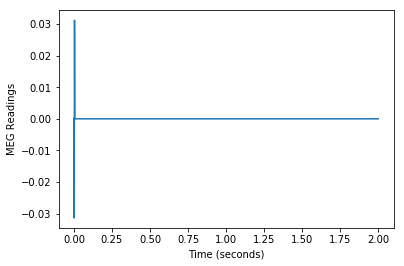

198 MEG Readings for Sensor  ['A136']


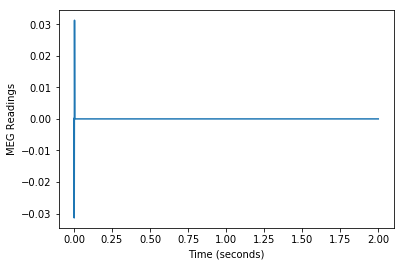

199 MEG Readings for Sensor  ['A184']


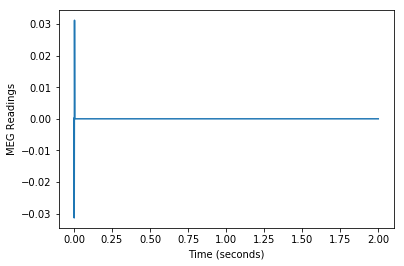

200 MEG Readings for Sensor  ['A51']


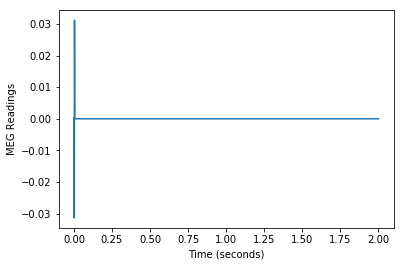

201 MEG Readings for Sensor  ['A237']


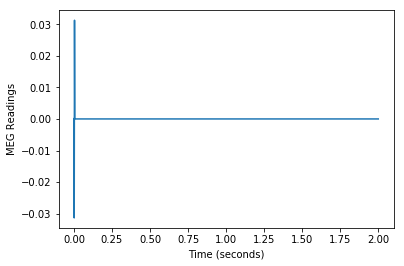

202 MEG Readings for Sensor  ['A77']


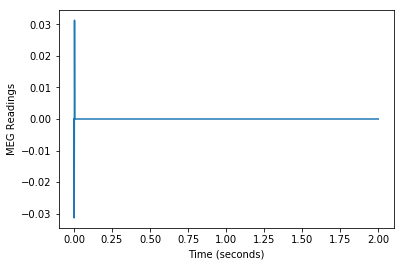

203 MEG Readings for Sensor  ['A129']


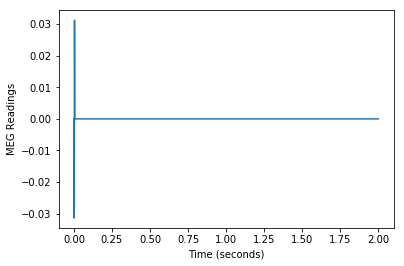

204 MEG Readings for Sensor  ['A131']


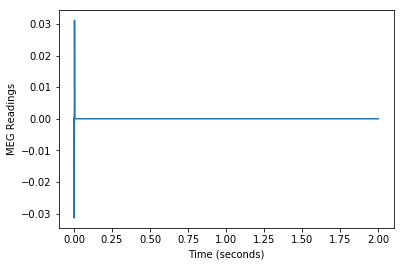

205 MEG Readings for Sensor  ['A198']


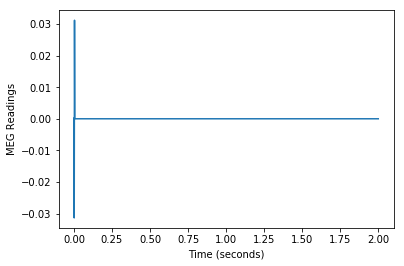

206 MEG Readings for Sensor  ['A197']


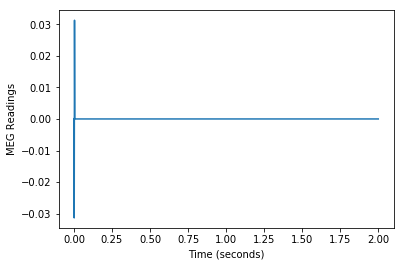

207 MEG Readings for Sensor  ['A182']


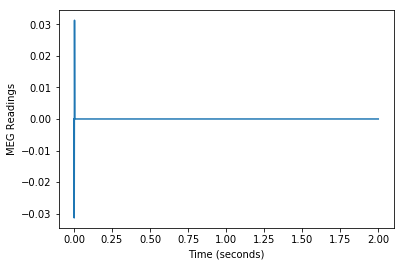

208 MEG Readings for Sensor  ['A46']


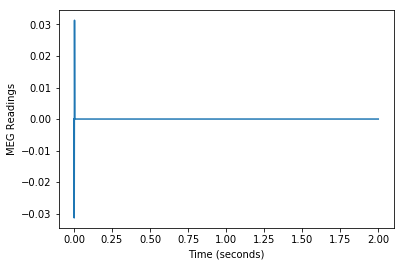

209 MEG Readings for Sensor  ['A92']


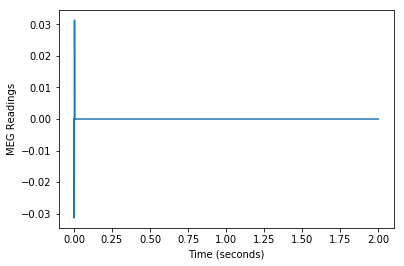

210 MEG Readings for Sensor  ['A41']


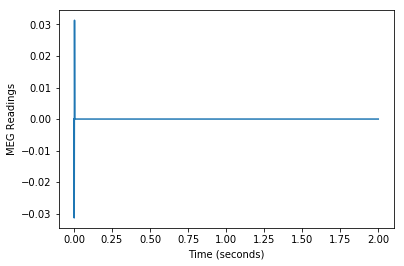

211 MEG Readings for Sensor  ['A90']


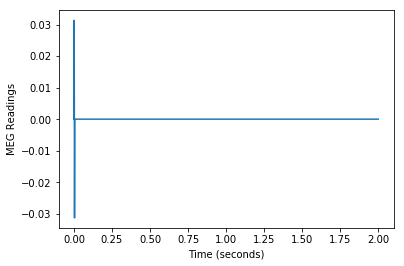

212 MEG Readings for Sensor  ['A7']


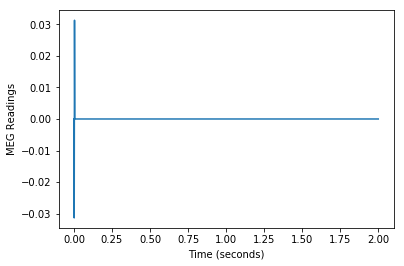

213 MEG Readings for Sensor  ['A23']


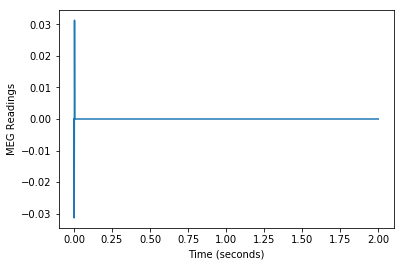

214 MEG Readings for Sensor  ['A83']


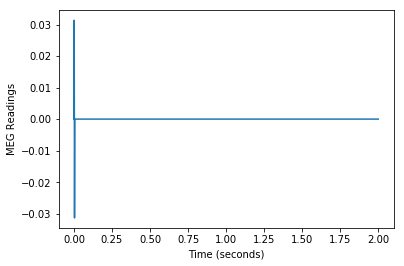

215 MEG Readings for Sensor  ['A154']


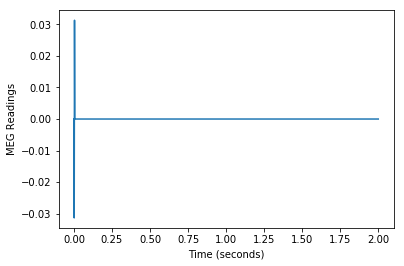

216 MEG Readings for Sensor  ['A34']


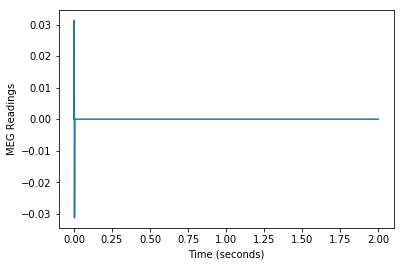

217 MEG Readings for Sensor  ['A17']


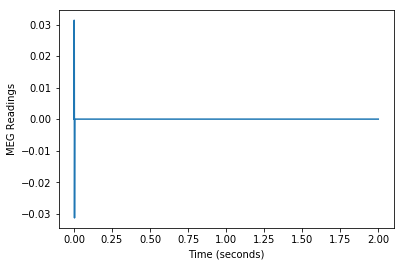

218 MEG Readings for Sensor  ['A18']


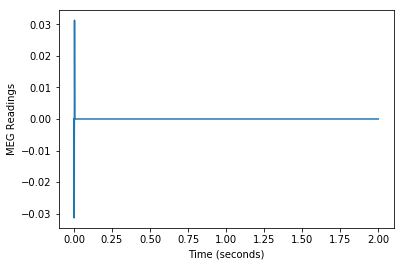

219 MEG Readings for Sensor  ['A248']


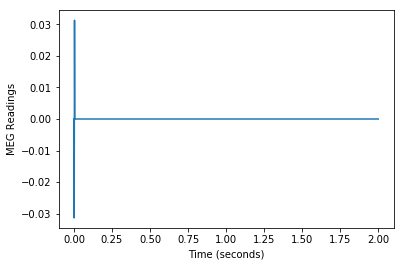

220 MEG Readings for Sensor  ['A149']


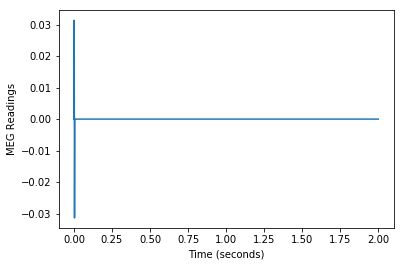

221 MEG Readings for Sensor  ['A118']


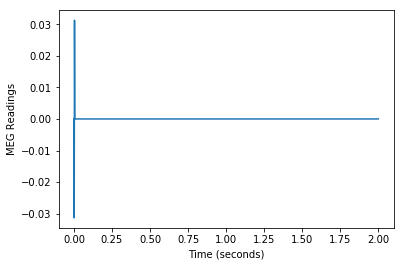

222 MEG Readings for Sensor  ['A208']


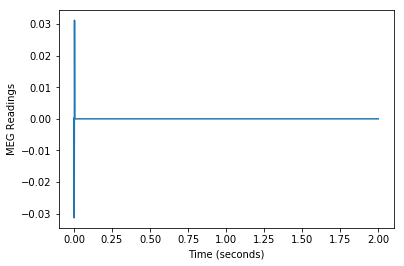

223 MEG Readings for Sensor  ['A152']


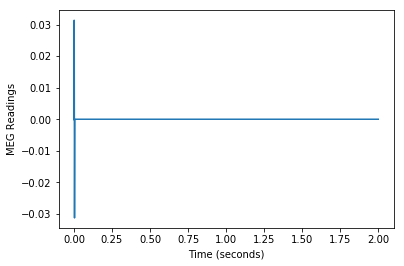

224 MEG Readings for Sensor  ['A140']


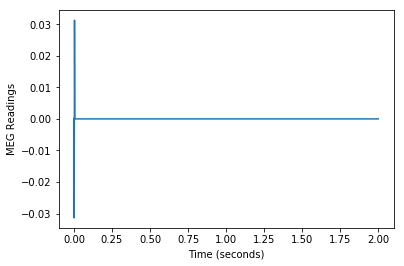

225 MEG Readings for Sensor  ['A144']


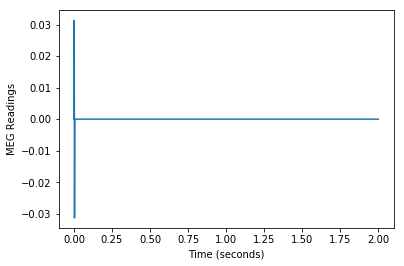

226 MEG Readings for Sensor  ['A209']


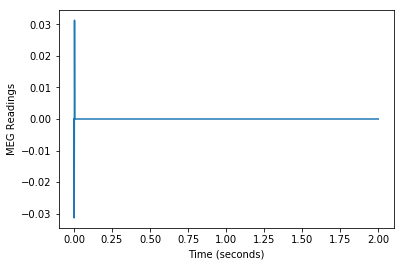

227 MEG Readings for Sensor  ['A110']


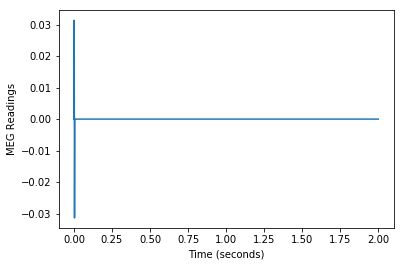

228 MEG Readings for Sensor  ['A111']


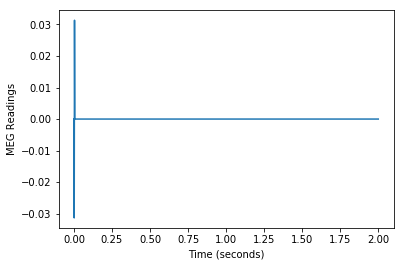

229 MEG Readings for Sensor  ['A244']


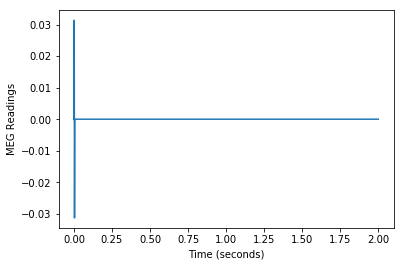

230 MEG Readings for Sensor  ['A185']


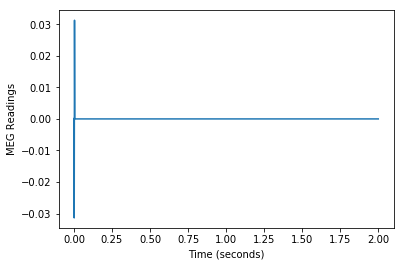

231 MEG Readings for Sensor  ['A162']


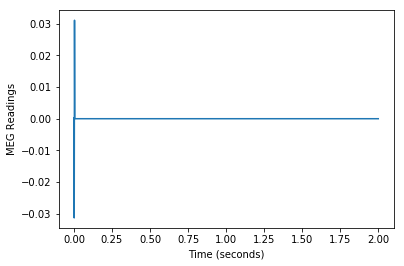

232 MEG Readings for Sensor  ['A106']


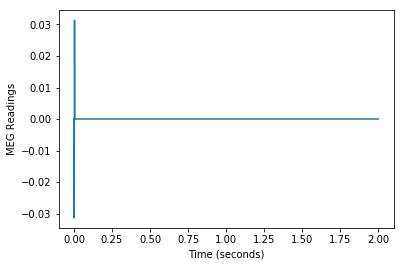

233 MEG Readings for Sensor  ['A187']


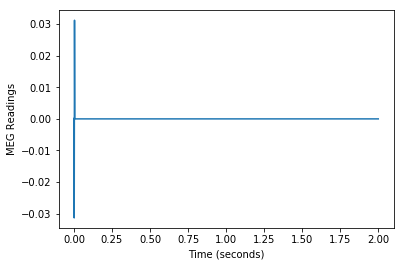

234 MEG Readings for Sensor  ['A48']


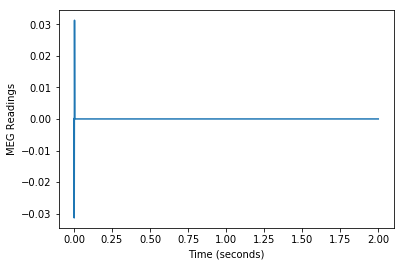

235 MEG Readings for Sensor  ['A221']


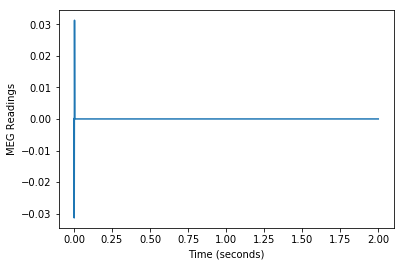

236 MEG Readings for Sensor  ['A196']


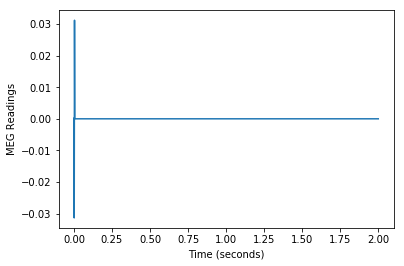

237 MEG Readings for Sensor  ['A133']


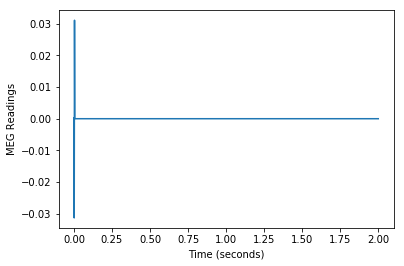

238 MEG Readings for Sensor  ['A158']


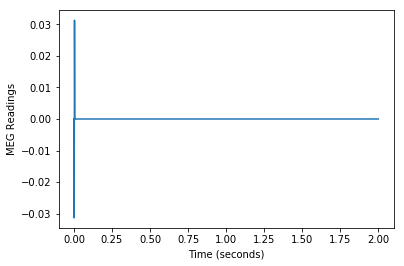

239 MEG Readings for Sensor  ['A44']


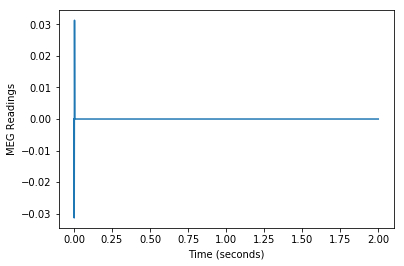

240 MEG Readings for Sensor  ['A134']


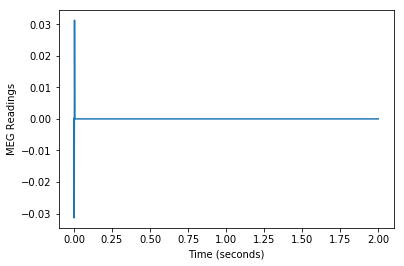

241 MEG Readings for Sensor  ['A216']


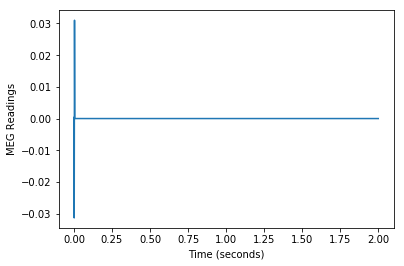

In [20]:
# 147 trials (for every MEG sensor), 241 sensors, and 1018 different time stamps for 1018 entries of MEG data (for each sensor)

import numpy as np
import scipy.io

data = scipy.io.loadmat('100307_MEG_3-Restin_rmegpreproc.mat')
    
data_trials = data['data'][0][0][4]
data_times = data['data'][0][0][5]
data_labels = data['data'][0][0][6]

import matplotlib.pyplot as plt
%matplotlib inline

for i in range(len(x)):
    plt.plot(data_times[0][0][0], x[i])
    plt.xlabel('Time (seconds)')
    plt.ylabel('MEG Readings')
    print(i+1, "MEG Readings for Sensor ", data_labels[i][0])
    plt.show()
    

In [9]:
# STOP HERE

1 MEG Readings for Sensor  ['A22']


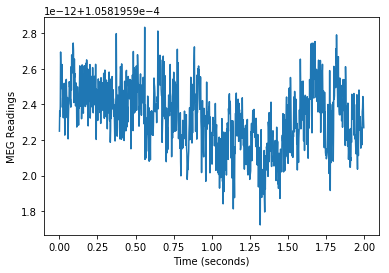

2 MEG Readings for Sensor  ['A104']


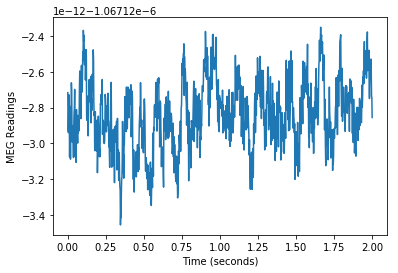

3 MEG Readings for Sensor  ['A241']


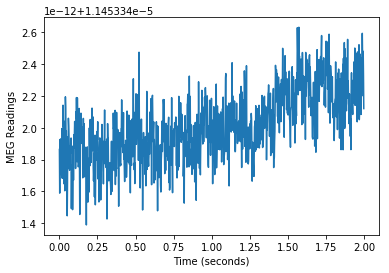

4 MEG Readings for Sensor  ['A138']


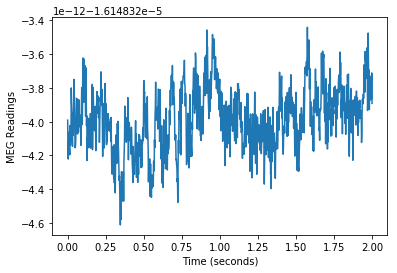

5 MEG Readings for Sensor  ['A214']


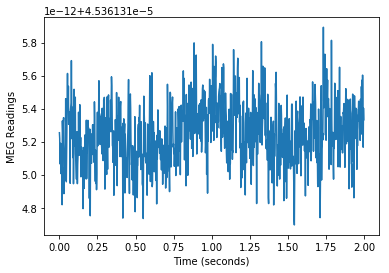

6 MEG Readings for Sensor  ['A71']


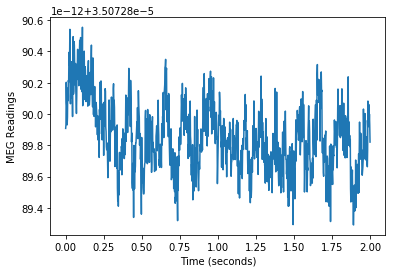

7 MEG Readings for Sensor  ['A26']


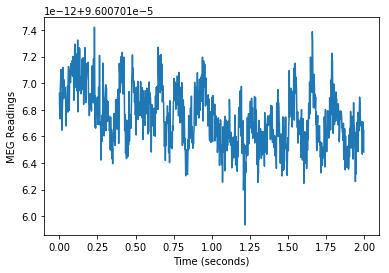

8 MEG Readings for Sensor  ['A93']


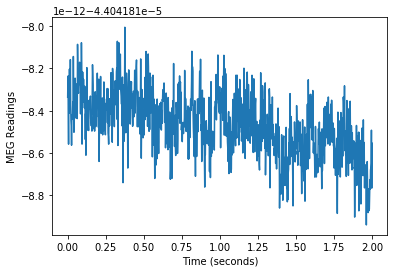

9 MEG Readings for Sensor  ['A39']


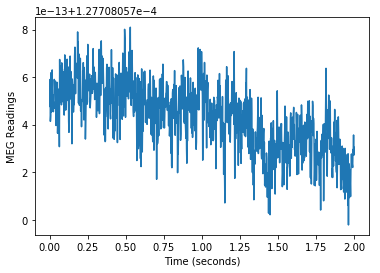

10 MEG Readings for Sensor  ['A125']


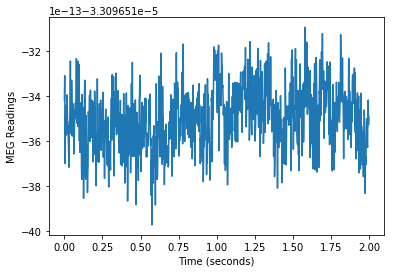

11 MEG Readings for Sensor  ['A20']


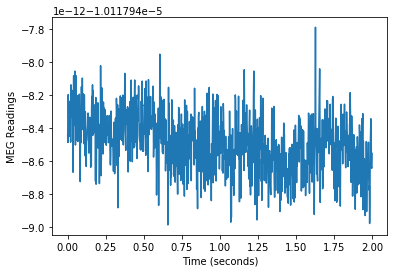

12 MEG Readings for Sensor  ['A65']


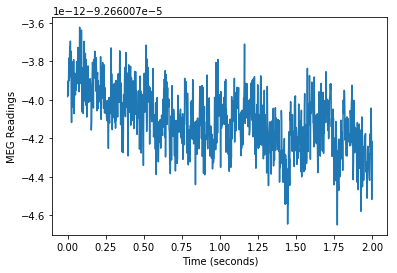

13 MEG Readings for Sensor  ['A9']


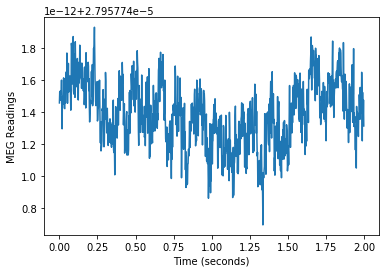

14 MEG Readings for Sensor  ['A95']


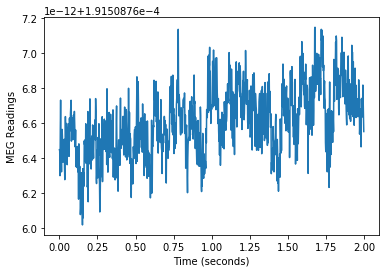

15 MEG Readings for Sensor  ['A114']


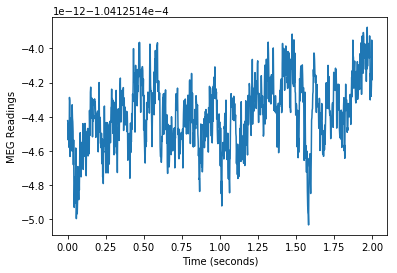

16 MEG Readings for Sensor  ['A175']


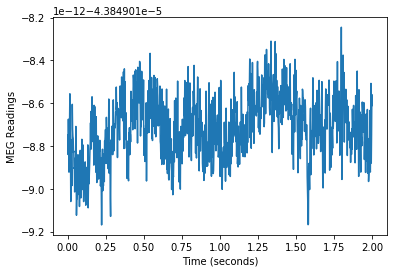

17 MEG Readings for Sensor  ['A16']


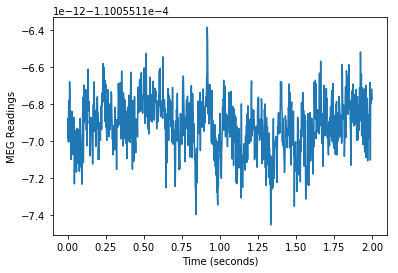

18 MEG Readings for Sensor  ['A228']


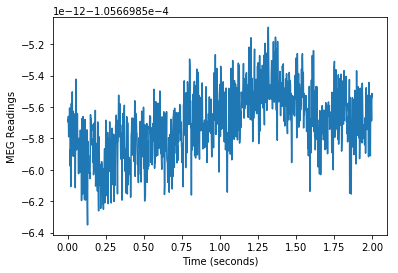

19 MEG Readings for Sensor  ['A35']


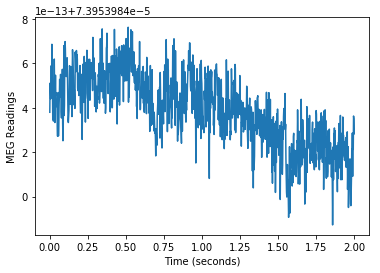

20 MEG Readings for Sensor  ['A191']


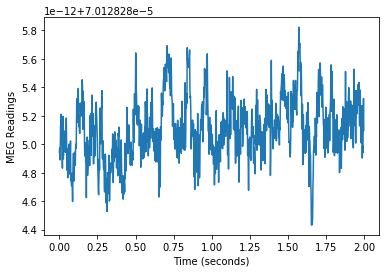

21 MEG Readings for Sensor  ['A37']


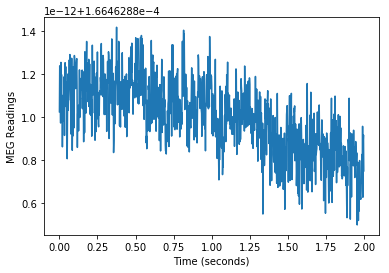

22 MEG Readings for Sensor  ['A170']


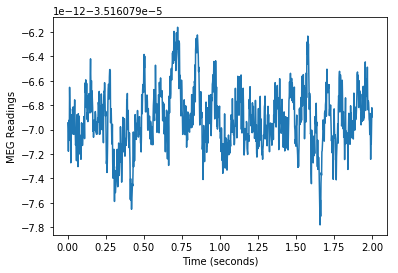

23 MEG Readings for Sensor  ['A207']


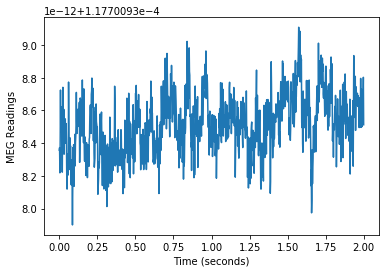

24 MEG Readings for Sensor  ['A224']


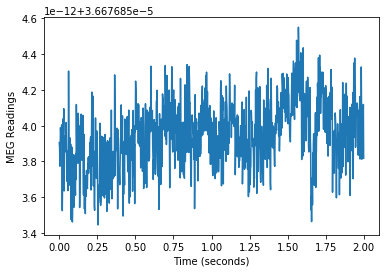

25 MEG Readings for Sensor  ['A82']


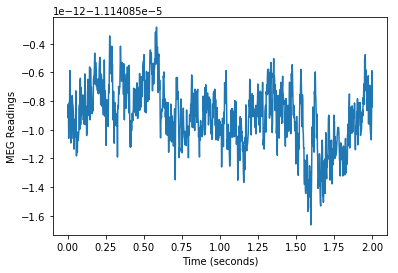

26 MEG Readings for Sensor  ['A238']


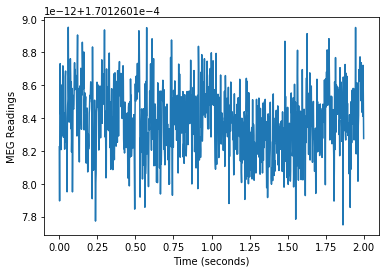

27 MEG Readings for Sensor  ['A202']


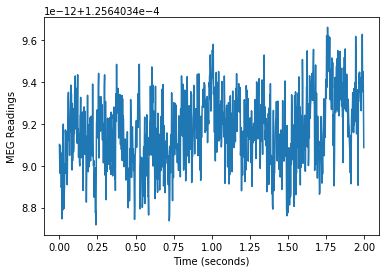

28 MEG Readings for Sensor  ['A220']


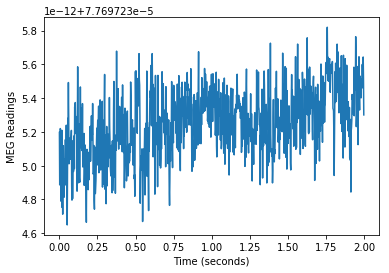

29 MEG Readings for Sensor  ['A28']


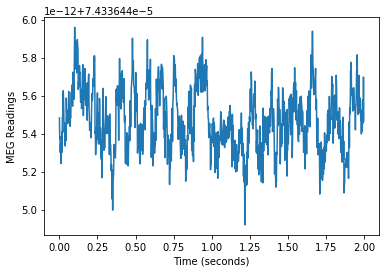

30 MEG Readings for Sensor  ['A239']


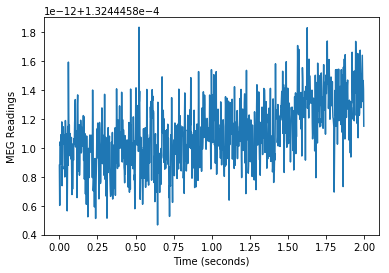

31 MEG Readings for Sensor  ['A13']


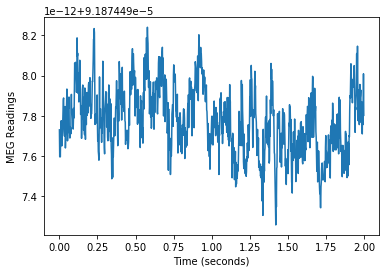

32 MEG Readings for Sensor  ['A165']


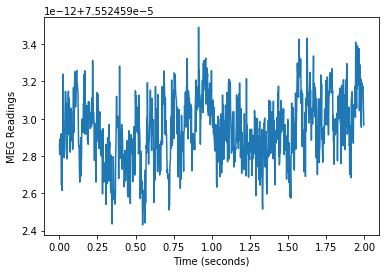

33 MEG Readings for Sensor  ['A204']


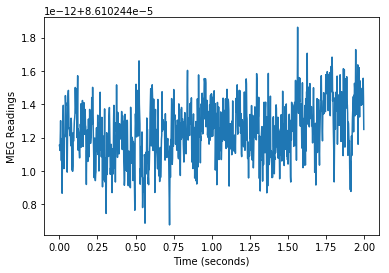

34 MEG Readings for Sensor  ['A233']


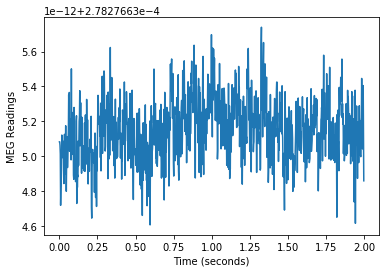

35 MEG Readings for Sensor  ['A98']


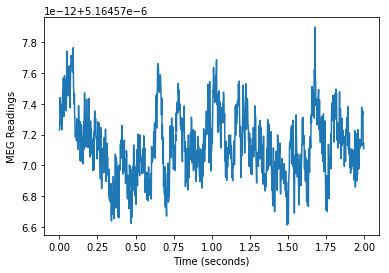

36 MEG Readings for Sensor  ['A25']


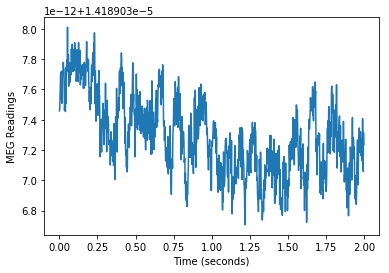

37 MEG Readings for Sensor  ['A70']


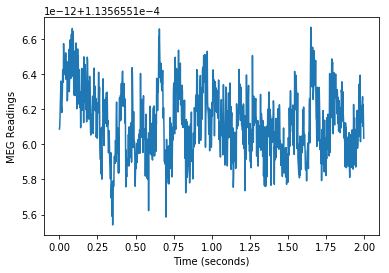

38 MEG Readings for Sensor  ['A72']


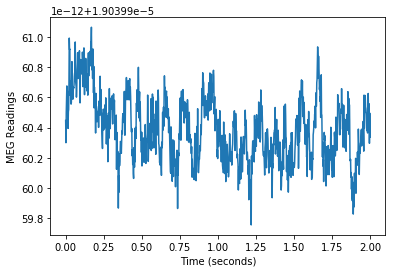

39 MEG Readings for Sensor  ['A11']


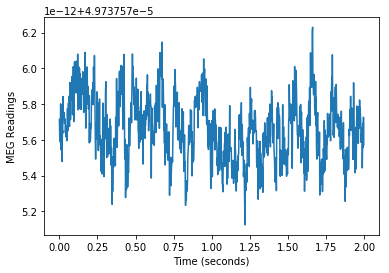

40 MEG Readings for Sensor  ['A47']


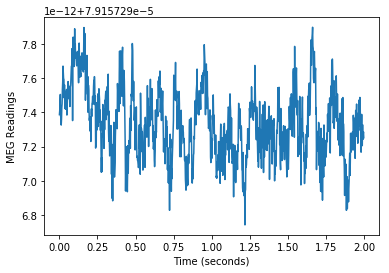

41 MEG Readings for Sensor  ['A160']


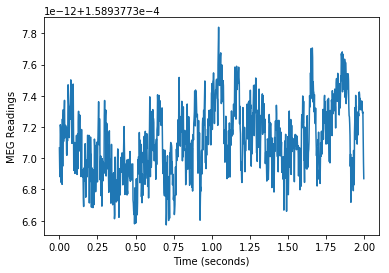

42 MEG Readings for Sensor  ['A64']


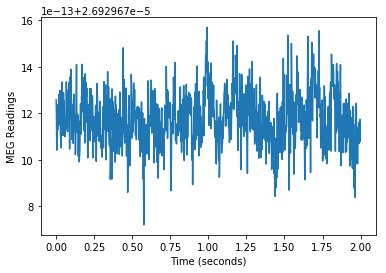

43 MEG Readings for Sensor  ['A3']


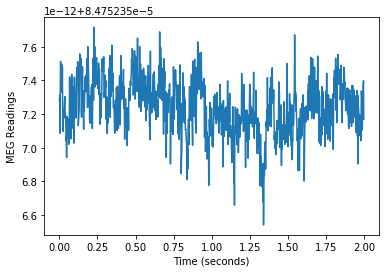

44 MEG Readings for Sensor  ['A177']


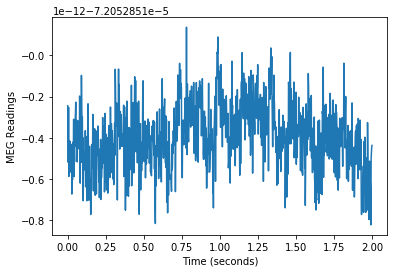

45 MEG Readings for Sensor  ['A63']


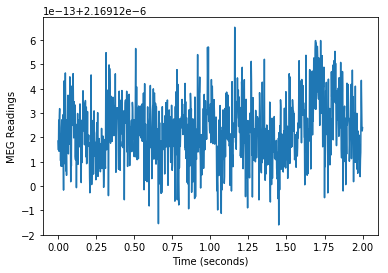

46 MEG Readings for Sensor  ['A155']


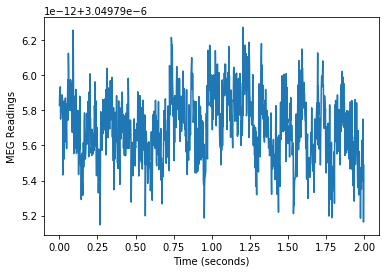

47 MEG Readings for Sensor  ['A10']


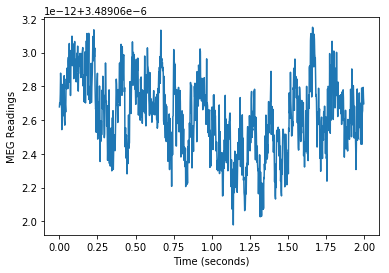

48 MEG Readings for Sensor  ['A127']


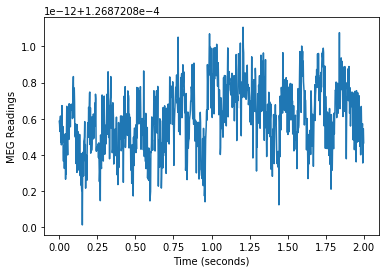

49 MEG Readings for Sensor  ['A67']


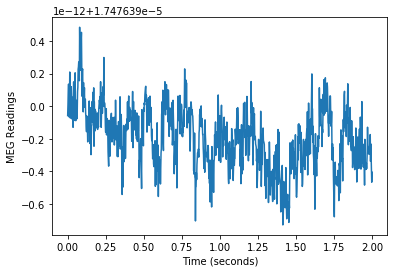

50 MEG Readings for Sensor  ['A115']


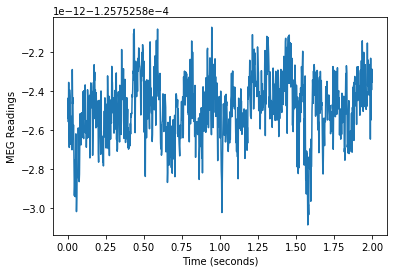

51 MEG Readings for Sensor  ['A247']


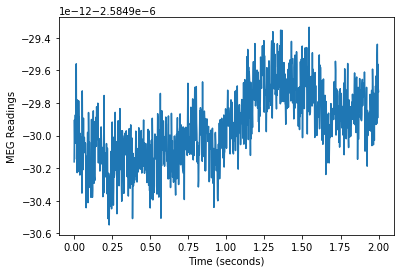

52 MEG Readings for Sensor  ['A174']


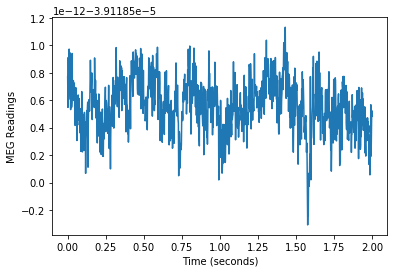

53 MEG Readings for Sensor  ['A194']


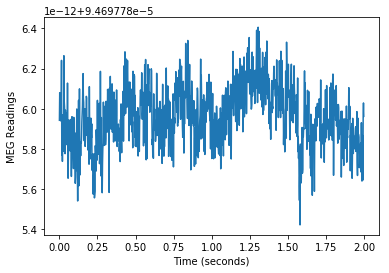

54 MEG Readings for Sensor  ['A5']


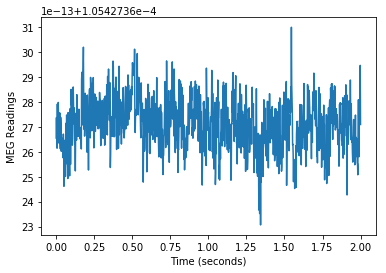

55 MEG Readings for Sensor  ['A242']


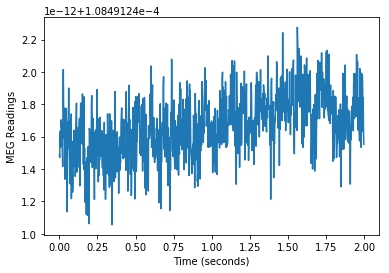

56 MEG Readings for Sensor  ['A176']


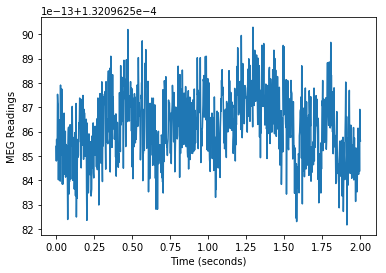

57 MEG Readings for Sensor  ['A78']


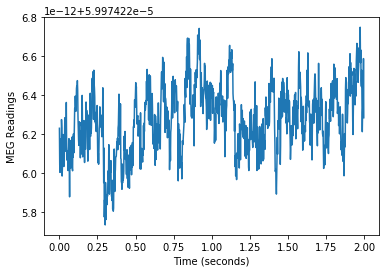

58 MEG Readings for Sensor  ['A168']


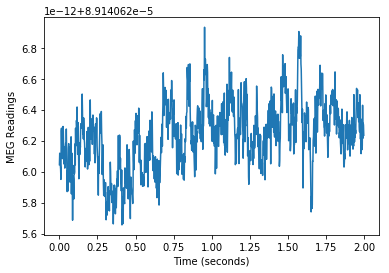

59 MEG Readings for Sensor  ['A31']


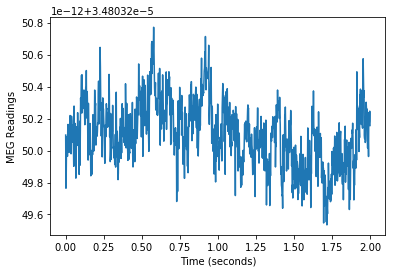

60 MEG Readings for Sensor  ['A223']


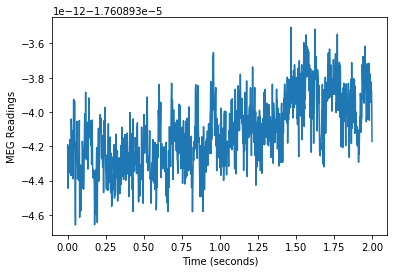

61 MEG Readings for Sensor  ['A245']


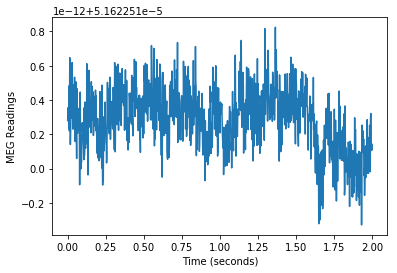

62 MEG Readings for Sensor  ['A219']


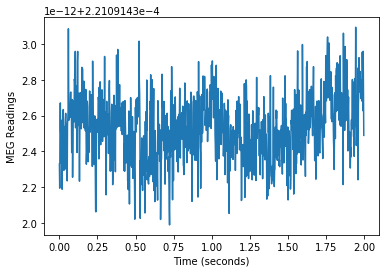

63 MEG Readings for Sensor  ['A12']


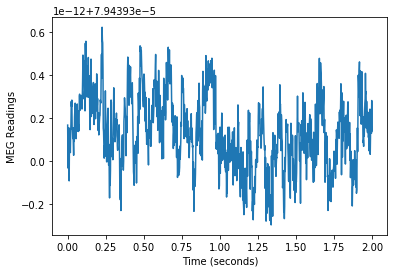

64 MEG Readings for Sensor  ['A186']


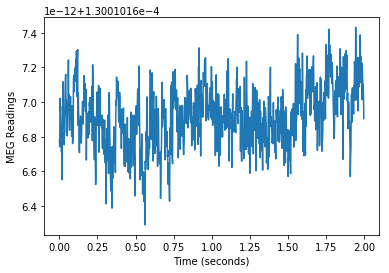

65 MEG Readings for Sensor  ['A105']


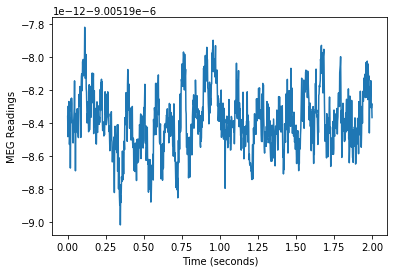

66 MEG Readings for Sensor  ['A222']


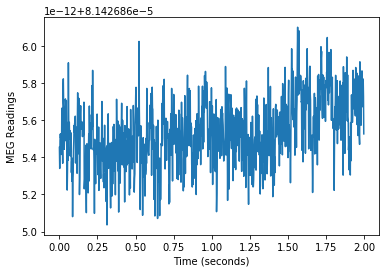

67 MEG Readings for Sensor  ['A76']


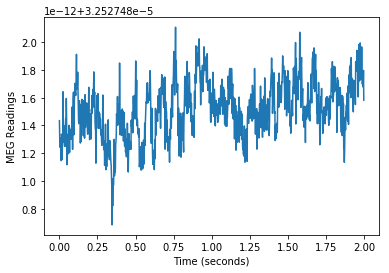

68 MEG Readings for Sensor  ['A50']


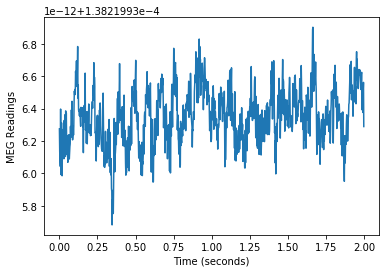

69 MEG Readings for Sensor  ['A188']


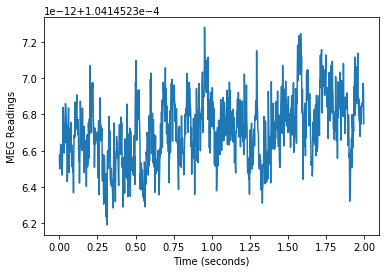

70 MEG Readings for Sensor  ['A231']


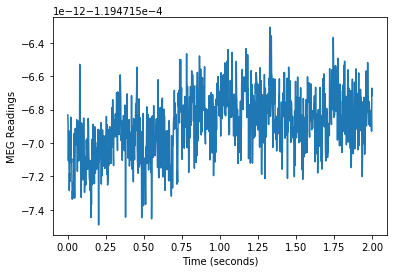

71 MEG Readings for Sensor  ['A45']


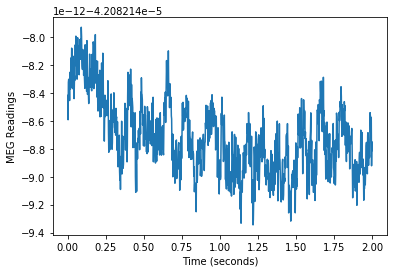

72 MEG Readings for Sensor  ['A180']


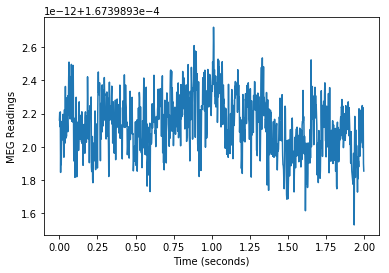

73 MEG Readings for Sensor  ['A99']


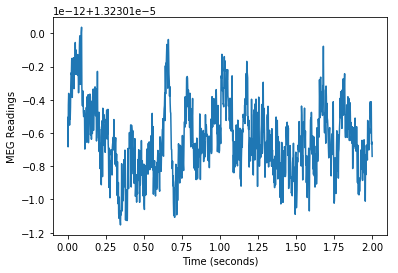

74 MEG Readings for Sensor  ['A234']


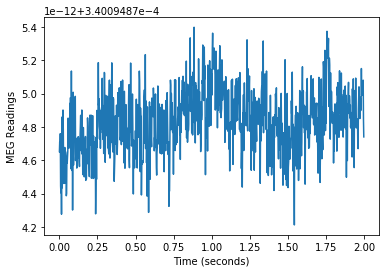

75 MEG Readings for Sensor  ['A215']


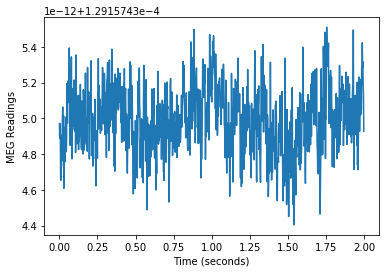

76 MEG Readings for Sensor  ['A235']


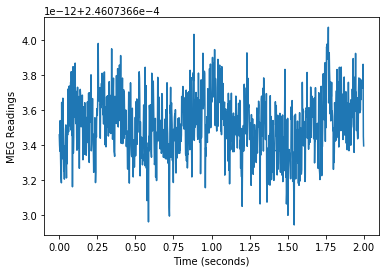

77 MEG Readings for Sensor  ['A181']


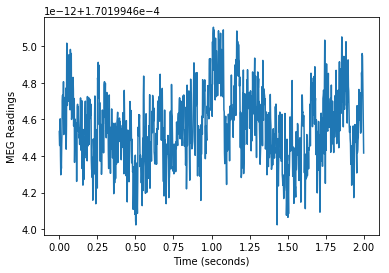

78 MEG Readings for Sensor  ['A38']


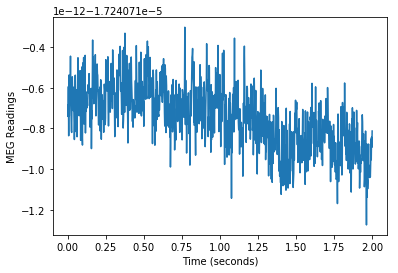

79 MEG Readings for Sensor  ['A230']


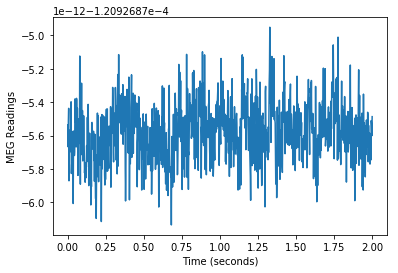

80 MEG Readings for Sensor  ['A91']


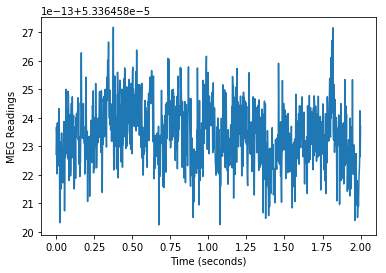

81 MEG Readings for Sensor  ['A212']


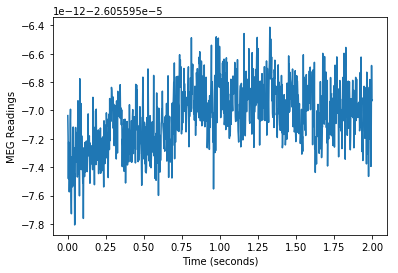

82 MEG Readings for Sensor  ['A24']


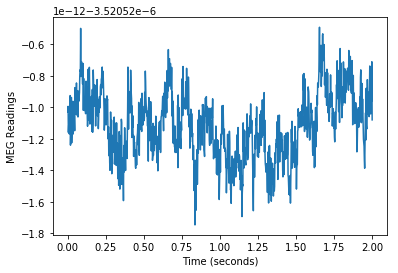

83 MEG Readings for Sensor  ['A66']


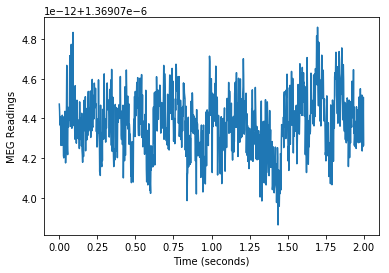

84 MEG Readings for Sensor  ['A42']


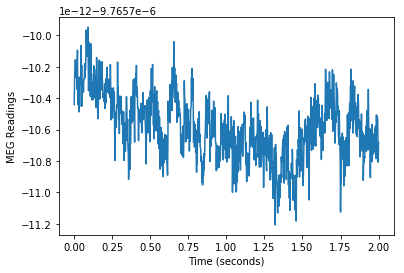

85 MEG Readings for Sensor  ['A96']


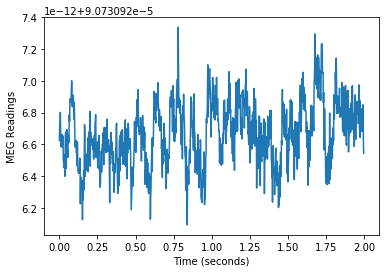

86 MEG Readings for Sensor  ['A57']


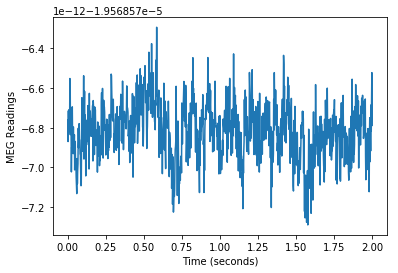

87 MEG Readings for Sensor  ['A86']


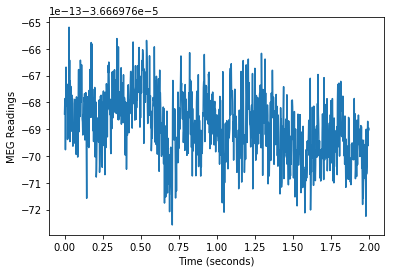

88 MEG Readings for Sensor  ['A56']


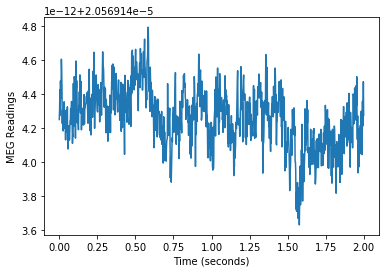

89 MEG Readings for Sensor  ['A116']


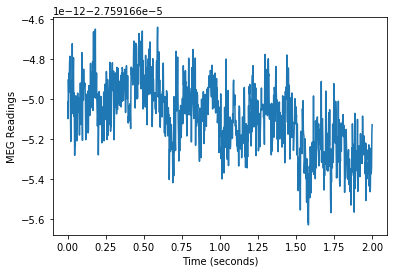

90 MEG Readings for Sensor  ['A151']


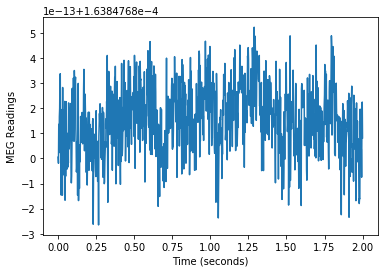

91 MEG Readings for Sensor  ['A141']


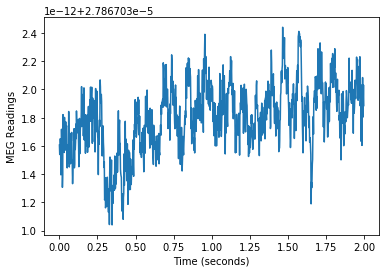

92 MEG Readings for Sensor  ['A120']


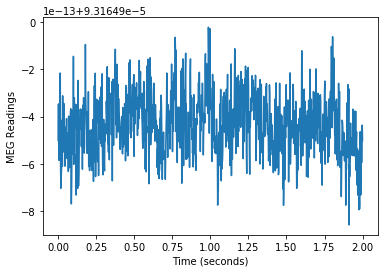

93 MEG Readings for Sensor  ['A189']


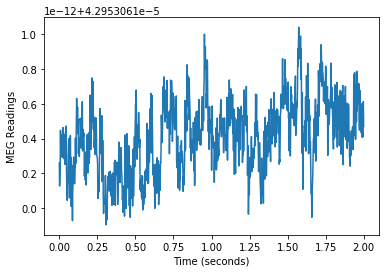

94 MEG Readings for Sensor  ['A80']


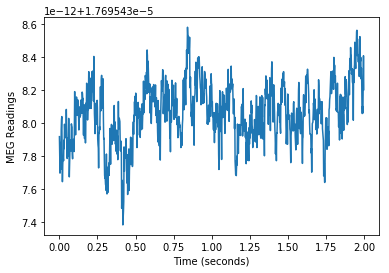

95 MEG Readings for Sensor  ['A143']


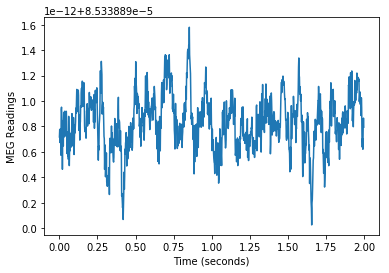

96 MEG Readings for Sensor  ['A113']


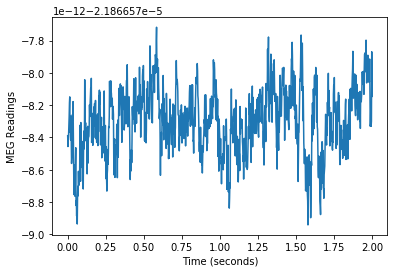

97 MEG Readings for Sensor  ['A27']


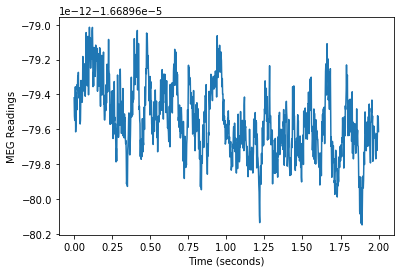

98 MEG Readings for Sensor  ['A137']


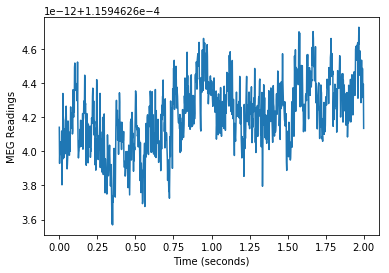

99 MEG Readings for Sensor  ['A135']


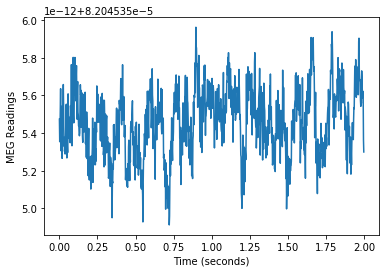

100 MEG Readings for Sensor  ['A167']


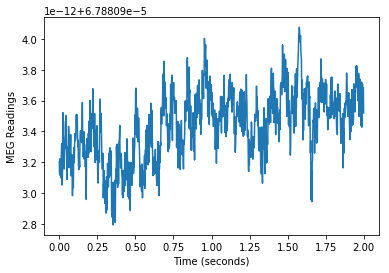

101 MEG Readings for Sensor  ['A75']


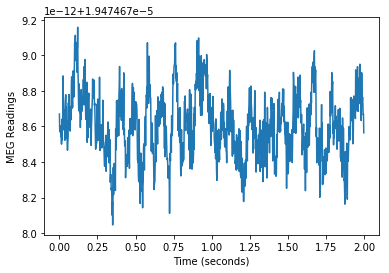

102 MEG Readings for Sensor  ['A240']


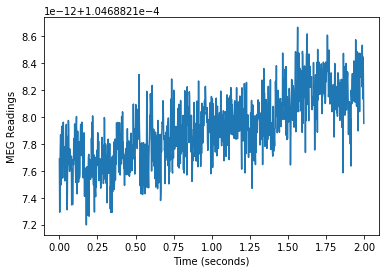

103 MEG Readings for Sensor  ['A206']


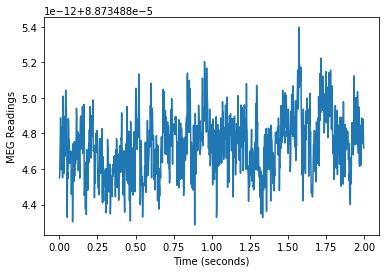

104 MEG Readings for Sensor  ['A107']


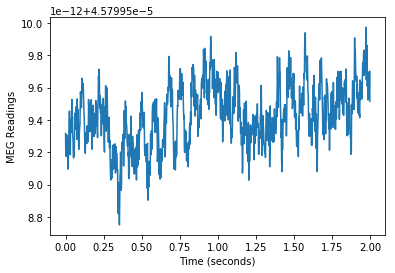

105 MEG Readings for Sensor  ['A130']


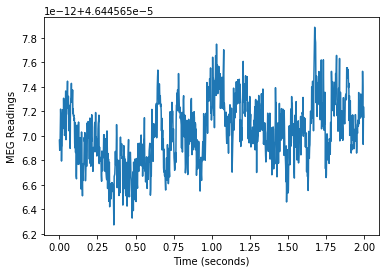

106 MEG Readings for Sensor  ['A100']


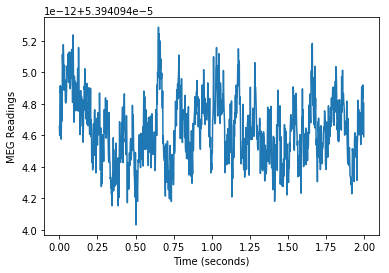

107 MEG Readings for Sensor  ['A43']


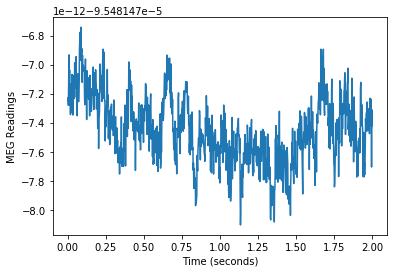

108 MEG Readings for Sensor  ['A200']


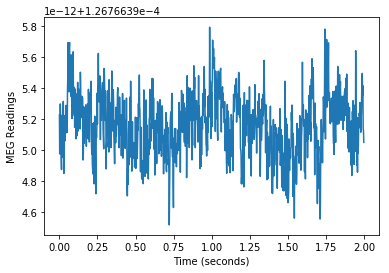

109 MEG Readings for Sensor  ['A102']


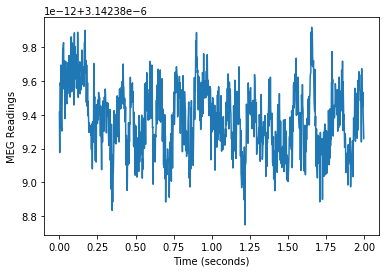

110 MEG Readings for Sensor  ['A132']


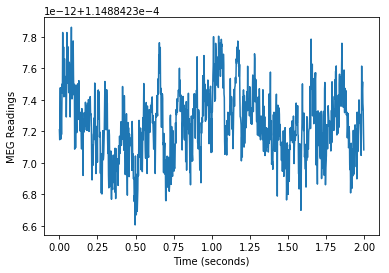

111 MEG Readings for Sensor  ['A183']


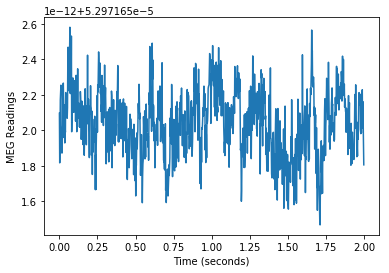

112 MEG Readings for Sensor  ['A199']


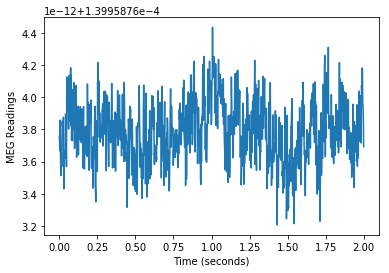

113 MEG Readings for Sensor  ['A122']


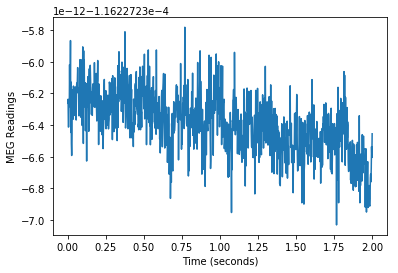

114 MEG Readings for Sensor  ['A19']


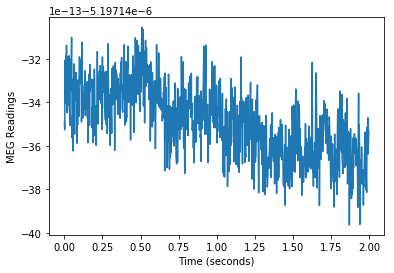

115 MEG Readings for Sensor  ['A62']


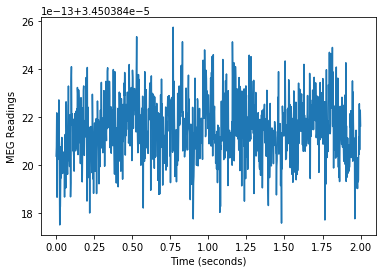

116 MEG Readings for Sensor  ['A21']


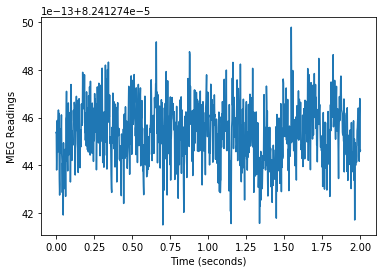

117 MEG Readings for Sensor  ['A229']


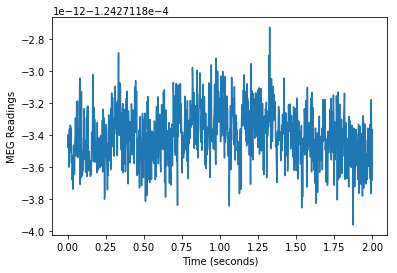

118 MEG Readings for Sensor  ['A84']


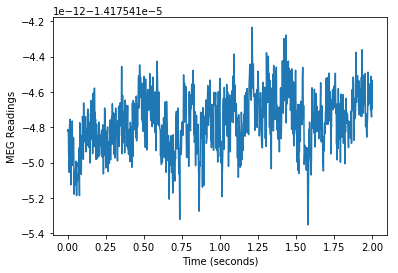

119 MEG Readings for Sensor  ['A213']


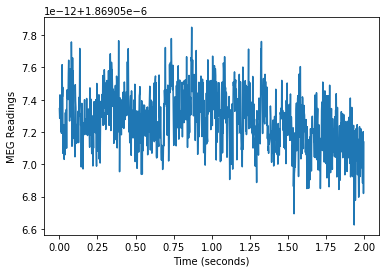

120 MEG Readings for Sensor  ['A55']


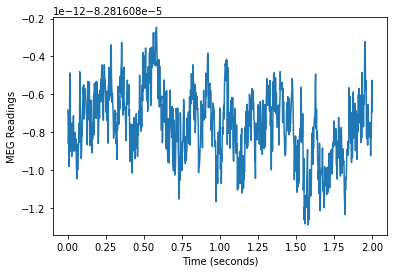

121 MEG Readings for Sensor  ['A32']


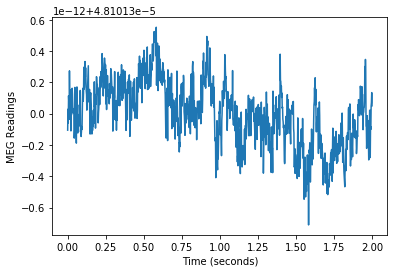

122 MEG Readings for Sensor  ['A85']


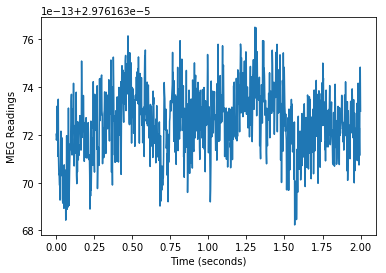

123 MEG Readings for Sensor  ['A146']


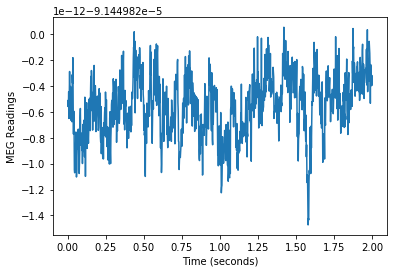

124 MEG Readings for Sensor  ['A58']


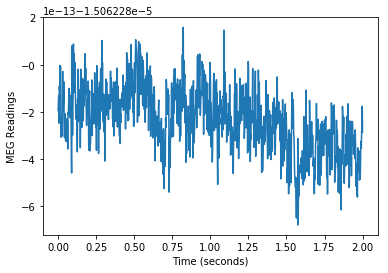

125 MEG Readings for Sensor  ['A60']


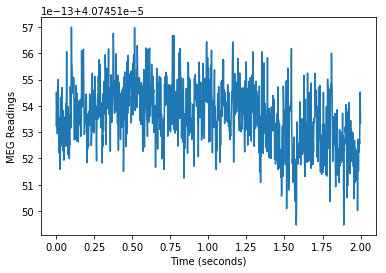

126 MEG Readings for Sensor  ['A88']


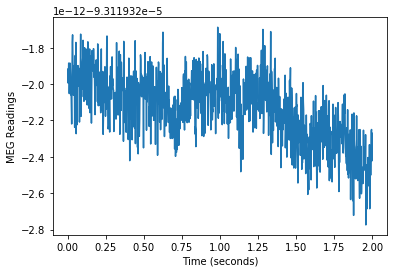

127 MEG Readings for Sensor  ['A79']


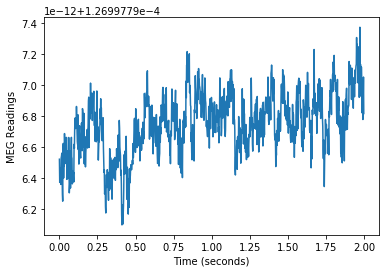

128 MEG Readings for Sensor  ['A169']


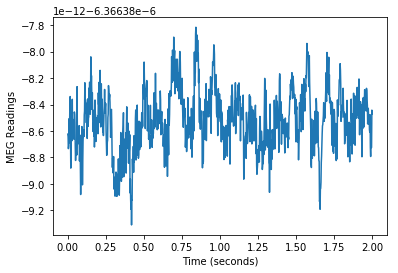

129 MEG Readings for Sensor  ['A54']


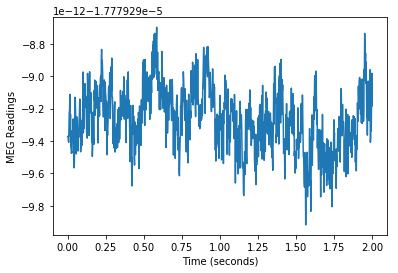

130 MEG Readings for Sensor  ['A203']


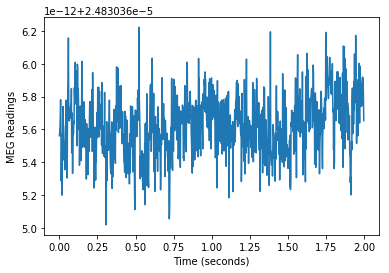

131 MEG Readings for Sensor  ['A145']


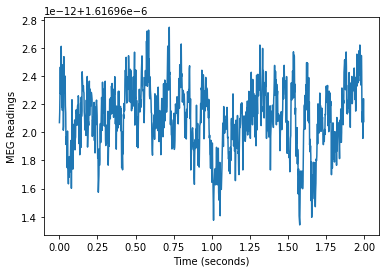

132 MEG Readings for Sensor  ['A103']


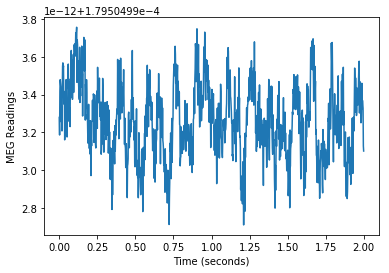

133 MEG Readings for Sensor  ['A163']


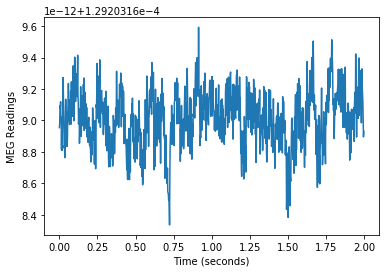

134 MEG Readings for Sensor  ['A139']


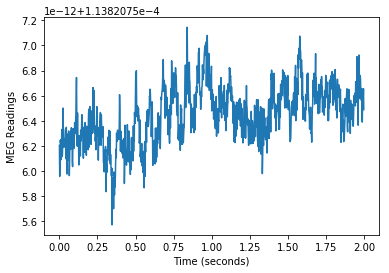

135 MEG Readings for Sensor  ['A49']


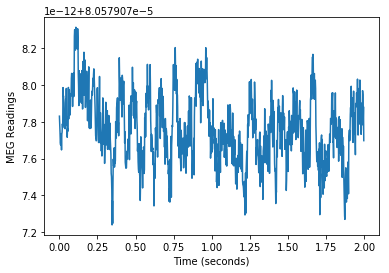

136 MEG Readings for Sensor  ['A166']


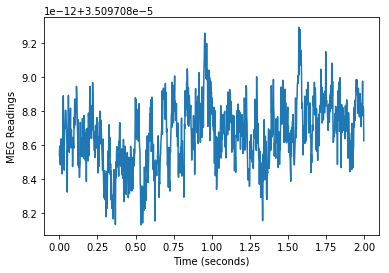

137 MEG Readings for Sensor  ['A156']


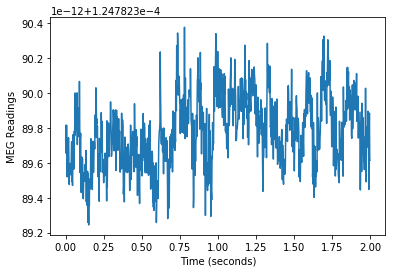

138 MEG Readings for Sensor  ['A128']


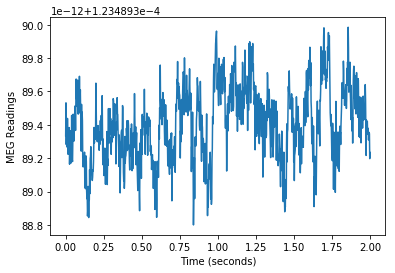

139 MEG Readings for Sensor  ['A68']


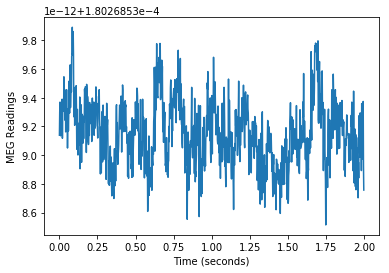

140 MEG Readings for Sensor  ['A159']


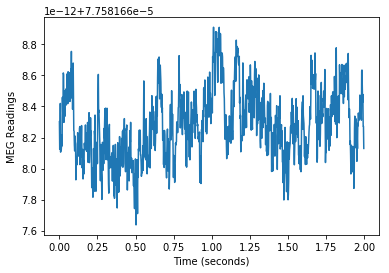

141 MEG Readings for Sensor  ['A236']


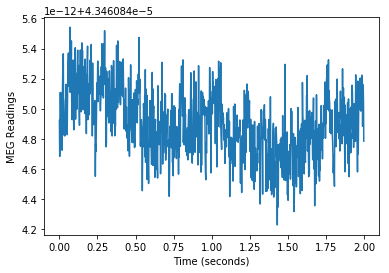

142 MEG Readings for Sensor  ['A161']


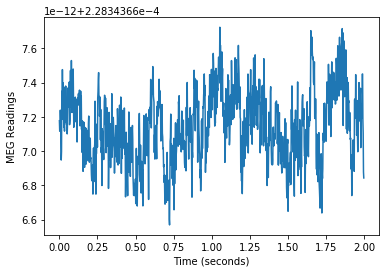

143 MEG Readings for Sensor  ['A121']


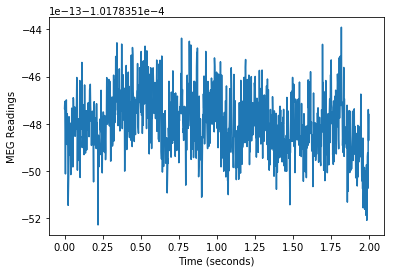

144 MEG Readings for Sensor  ['A4']


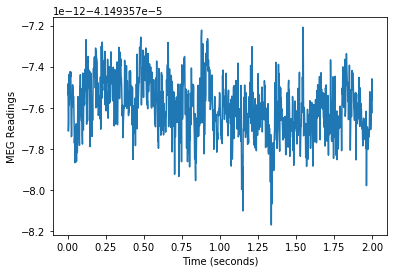

145 MEG Readings for Sensor  ['A61']


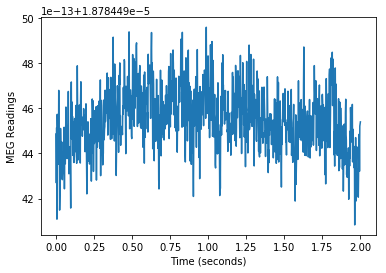

146 MEG Readings for Sensor  ['A6']


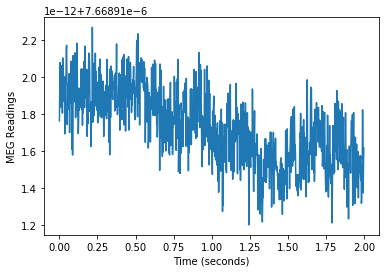

147 MEG Readings for Sensor  ['A14']


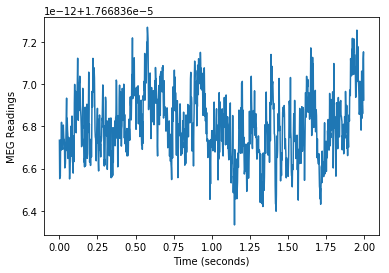

148 MEG Readings for Sensor  ['A94']


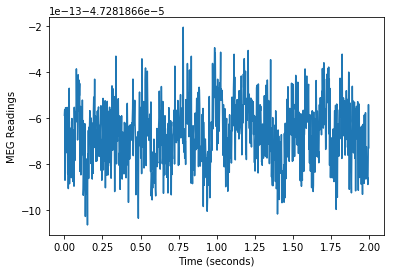

149 MEG Readings for Sensor  ['A15']


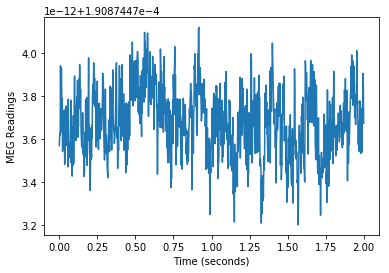

150 MEG Readings for Sensor  ['A193']


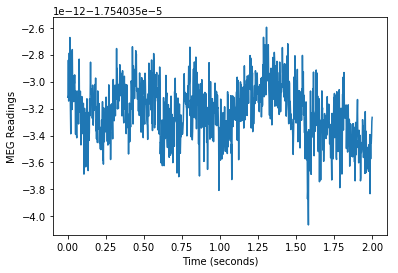

151 MEG Readings for Sensor  ['A150']


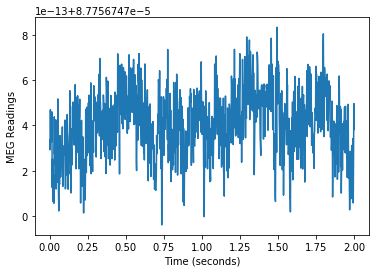

152 MEG Readings for Sensor  ['A227']


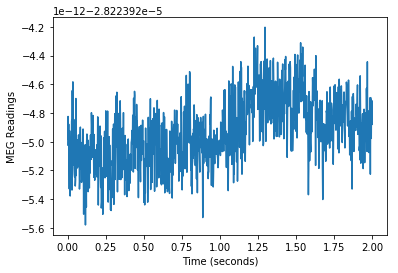

153 MEG Readings for Sensor  ['A59']


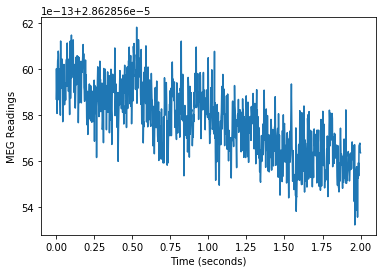

154 MEG Readings for Sensor  ['A36']


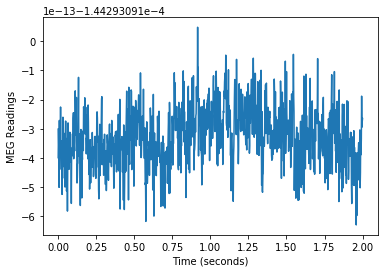

155 MEG Readings for Sensor  ['A225']


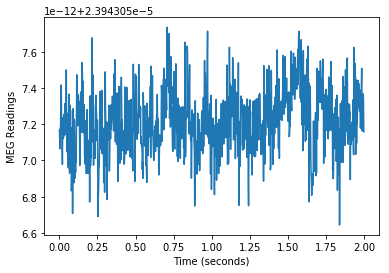

156 MEG Readings for Sensor  ['A195']


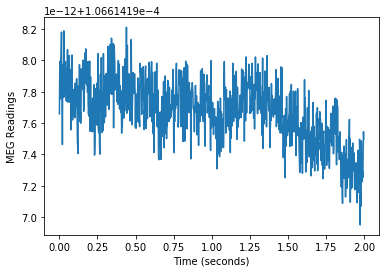

157 MEG Readings for Sensor  ['A30']


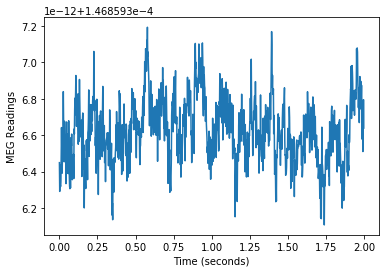

158 MEG Readings for Sensor  ['A109']


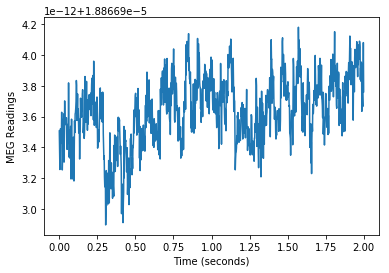

159 MEG Readings for Sensor  ['A172']


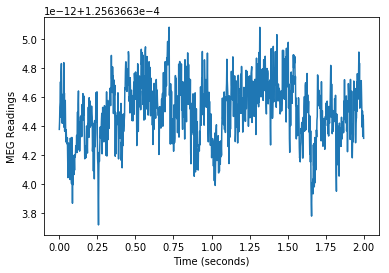

160 MEG Readings for Sensor  ['A108']


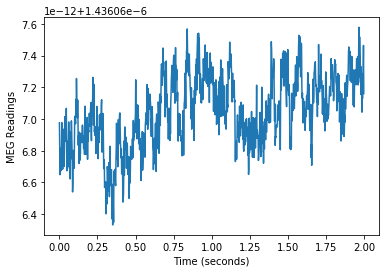

161 MEG Readings for Sensor  ['A81']


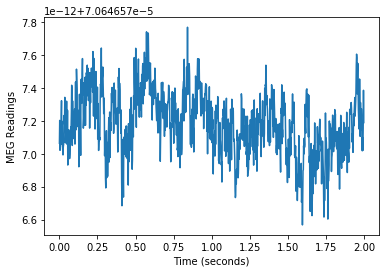

162 MEG Readings for Sensor  ['A171']


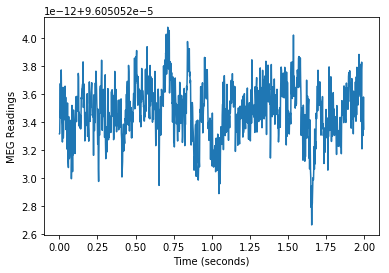

163 MEG Readings for Sensor  ['A218']


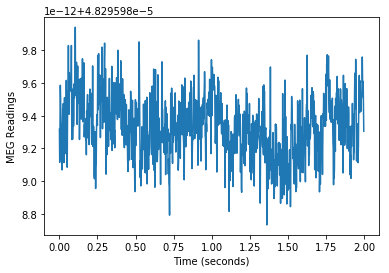

164 MEG Readings for Sensor  ['A173']


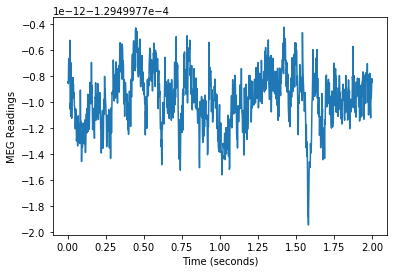

165 MEG Readings for Sensor  ['A201']


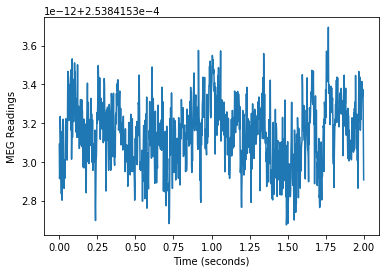

166 MEG Readings for Sensor  ['A74']


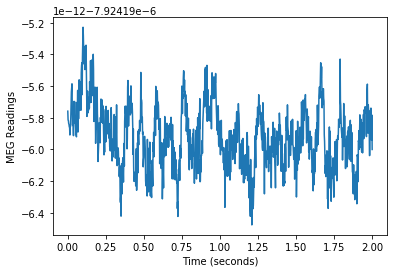

167 MEG Readings for Sensor  ['A29']


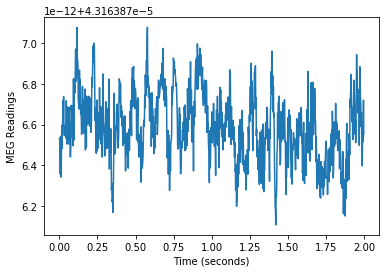

168 MEG Readings for Sensor  ['A164']


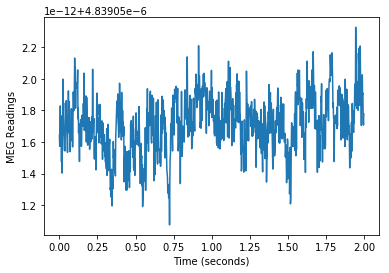

169 MEG Readings for Sensor  ['A205']


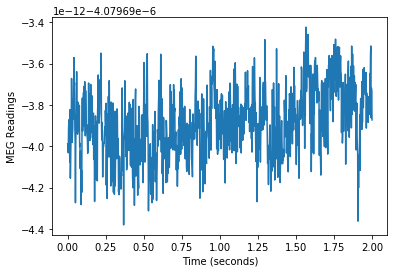

170 MEG Readings for Sensor  ['A69']


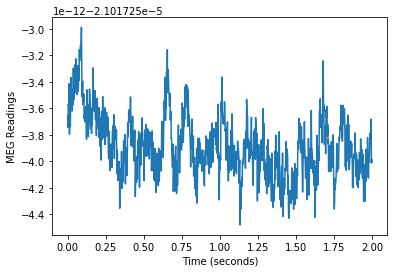

171 MEG Readings for Sensor  ['A157']


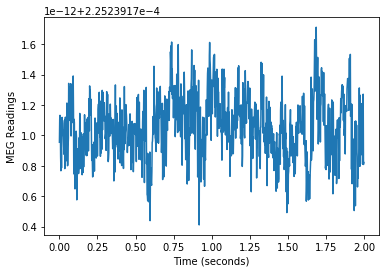

172 MEG Readings for Sensor  ['A97']


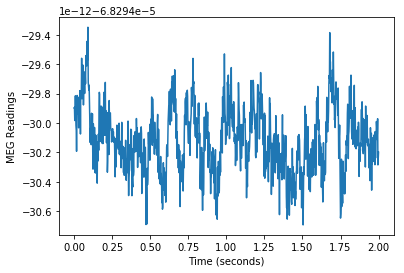

173 MEG Readings for Sensor  ['A217']


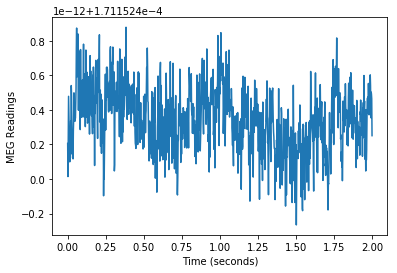

174 MEG Readings for Sensor  ['A101']


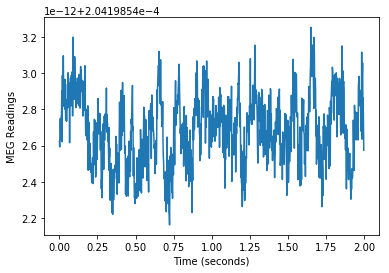

175 MEG Readings for Sensor  ['A124']


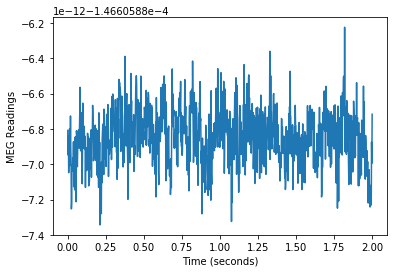

176 MEG Readings for Sensor  ['A40']


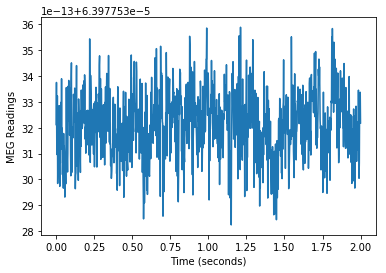

177 MEG Readings for Sensor  ['A123']


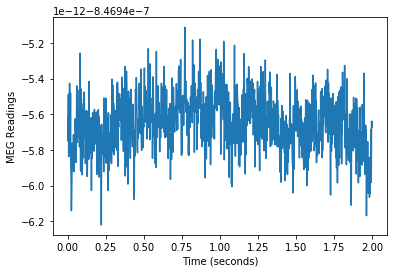

178 MEG Readings for Sensor  ['A153']


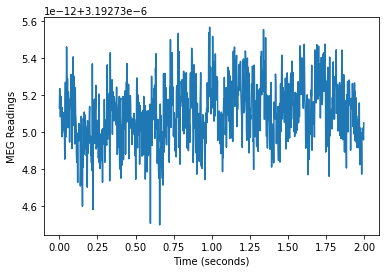

179 MEG Readings for Sensor  ['A178']


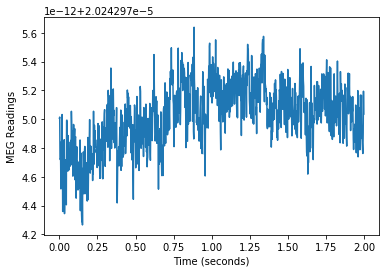

180 MEG Readings for Sensor  ['A1']


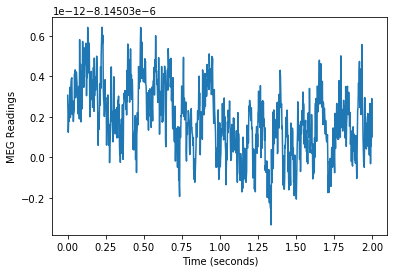

181 MEG Readings for Sensor  ['A179']


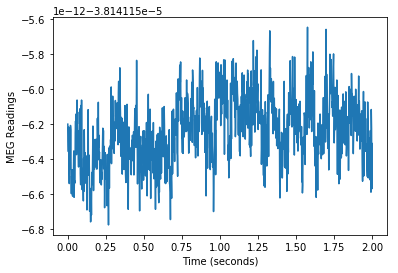

182 MEG Readings for Sensor  ['A33']


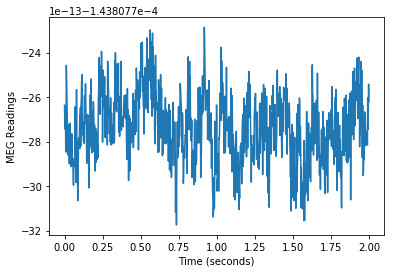

183 MEG Readings for Sensor  ['A147']


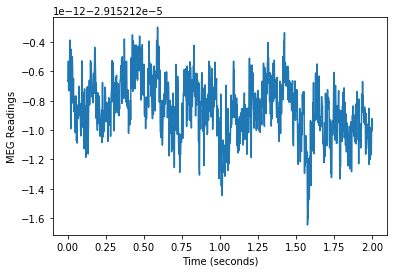

184 MEG Readings for Sensor  ['A117']


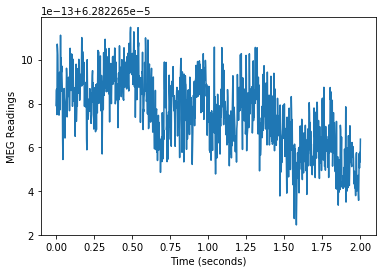

185 MEG Readings for Sensor  ['A148']


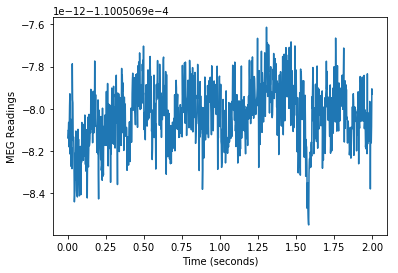

186 MEG Readings for Sensor  ['A87']


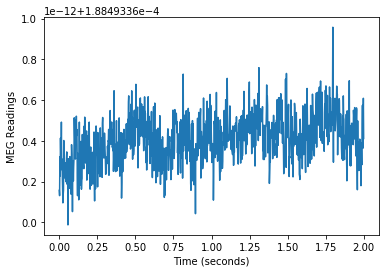

187 MEG Readings for Sensor  ['A89']


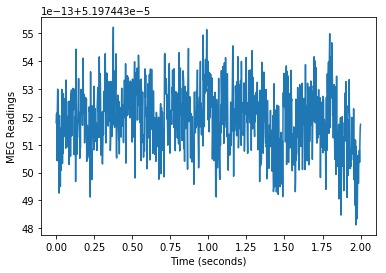

188 MEG Readings for Sensor  ['A243']


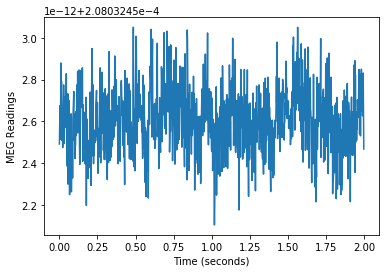

189 MEG Readings for Sensor  ['A119']


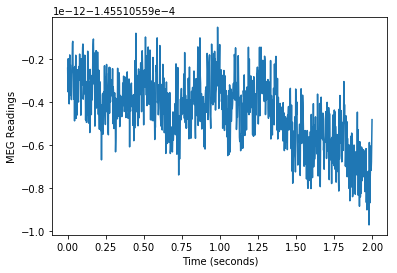

190 MEG Readings for Sensor  ['A52']


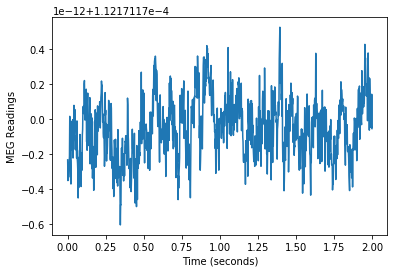

191 MEG Readings for Sensor  ['A142']


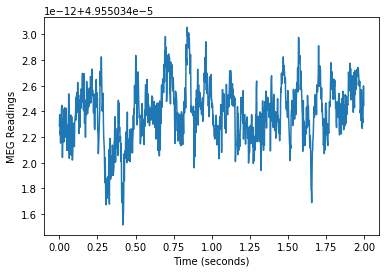

192 MEG Readings for Sensor  ['A211']


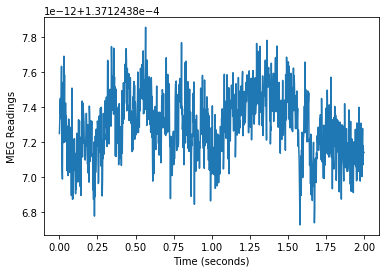

193 MEG Readings for Sensor  ['A190']


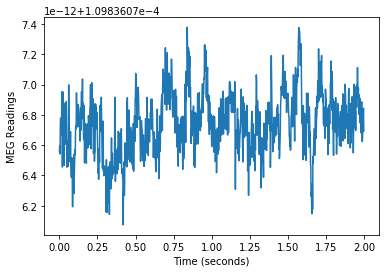

194 MEG Readings for Sensor  ['A53']


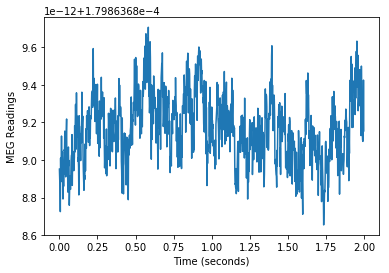

195 MEG Readings for Sensor  ['A192']


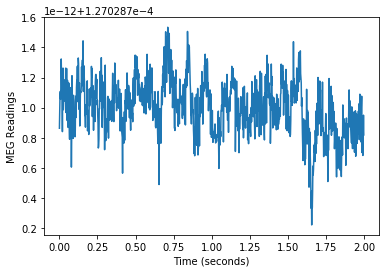

196 MEG Readings for Sensor  ['A73']


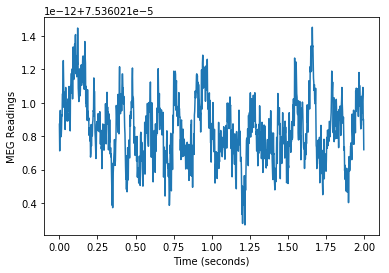

197 MEG Readings for Sensor  ['A226']


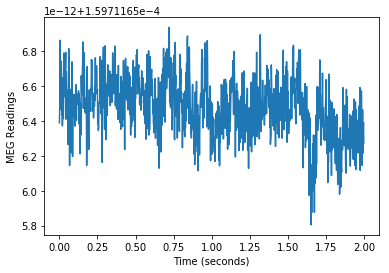

198 MEG Readings for Sensor  ['A136']


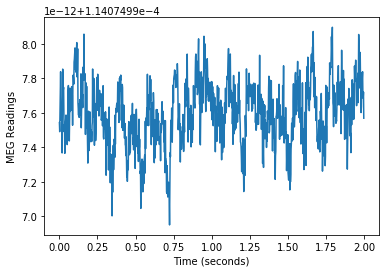

199 MEG Readings for Sensor  ['A184']


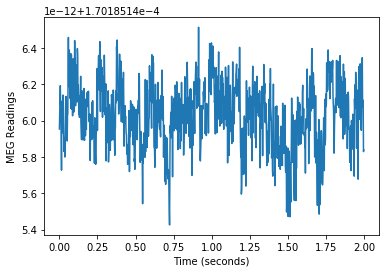

200 MEG Readings for Sensor  ['A51']


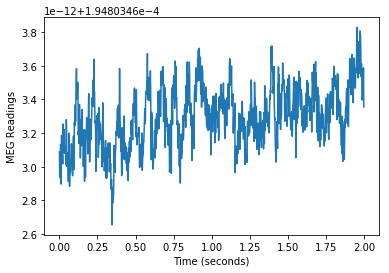

201 MEG Readings for Sensor  ['A237']


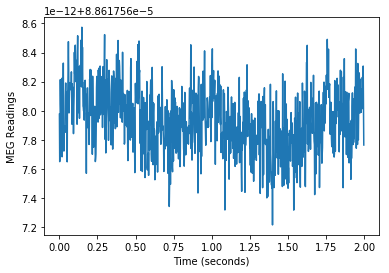

202 MEG Readings for Sensor  ['A77']


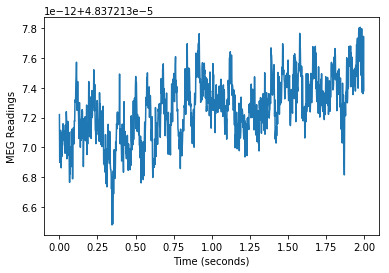

203 MEG Readings for Sensor  ['A129']


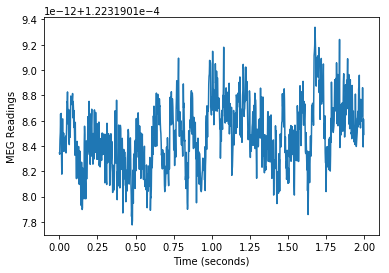

204 MEG Readings for Sensor  ['A131']


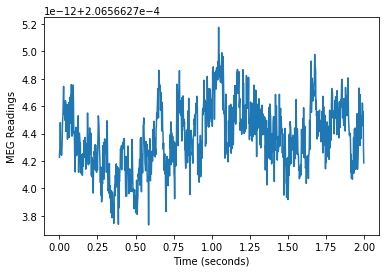

205 MEG Readings for Sensor  ['A198']


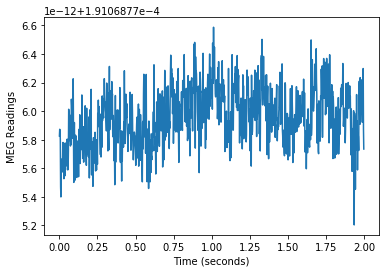

206 MEG Readings for Sensor  ['A197']


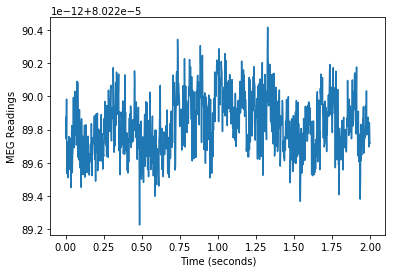

207 MEG Readings for Sensor  ['A182']


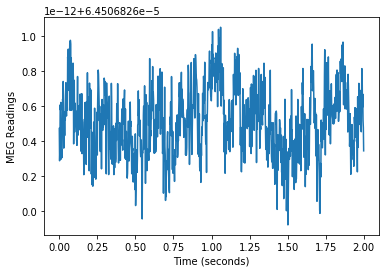

208 MEG Readings for Sensor  ['A46']


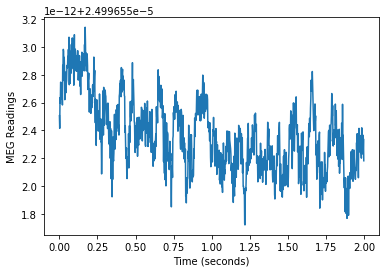

209 MEG Readings for Sensor  ['A92']


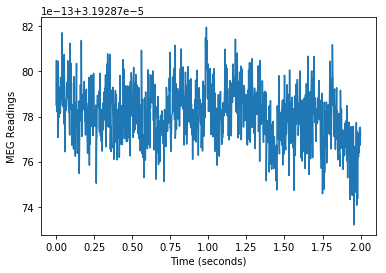

210 MEG Readings for Sensor  ['A41']


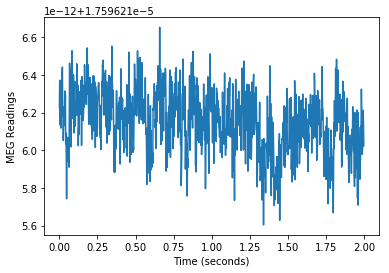

211 MEG Readings for Sensor  ['A90']


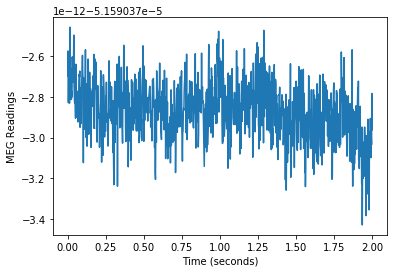

212 MEG Readings for Sensor  ['A7']


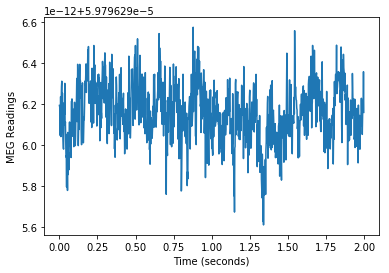

213 MEG Readings for Sensor  ['A23']


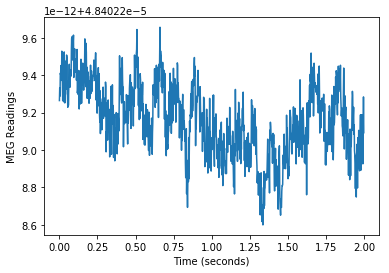

214 MEG Readings for Sensor  ['A83']


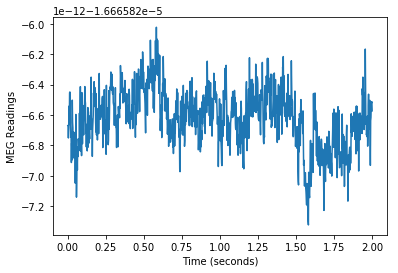

215 MEG Readings for Sensor  ['A154']


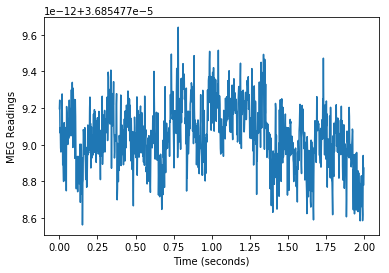

216 MEG Readings for Sensor  ['A34']


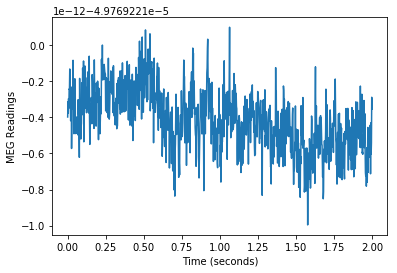

217 MEG Readings for Sensor  ['A17']


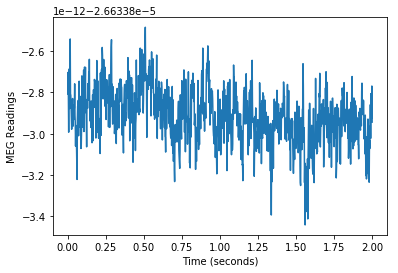

218 MEG Readings for Sensor  ['A18']


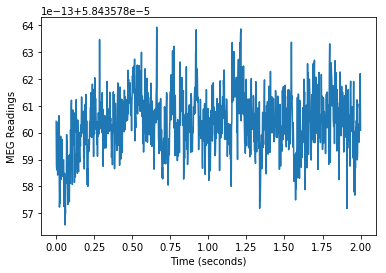

219 MEG Readings for Sensor  ['A248']


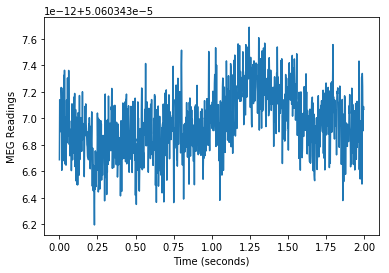

220 MEG Readings for Sensor  ['A149']


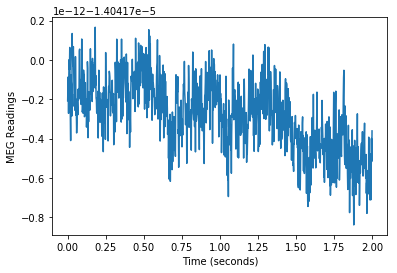

221 MEG Readings for Sensor  ['A118']


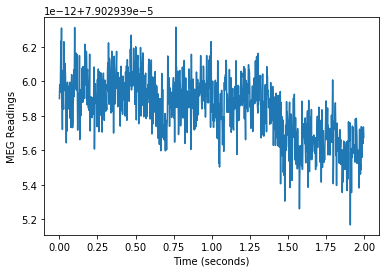

222 MEG Readings for Sensor  ['A208']


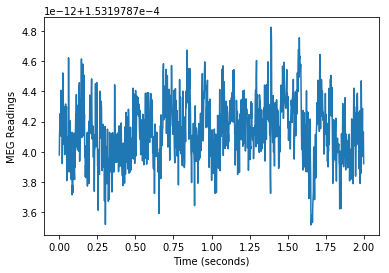

223 MEG Readings for Sensor  ['A152']


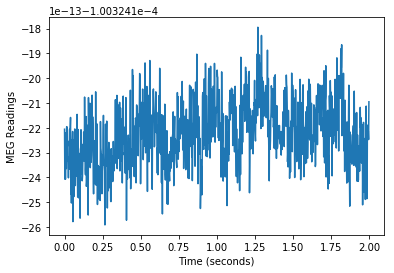

224 MEG Readings for Sensor  ['A140']


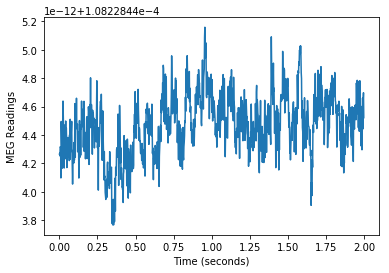

225 MEG Readings for Sensor  ['A144']


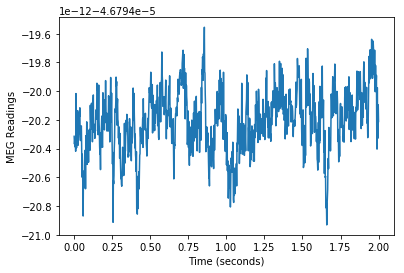

226 MEG Readings for Sensor  ['A209']


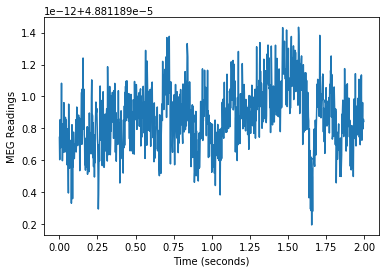

227 MEG Readings for Sensor  ['A110']


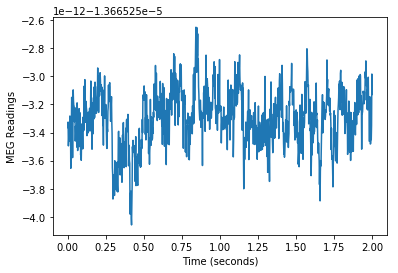

228 MEG Readings for Sensor  ['A111']


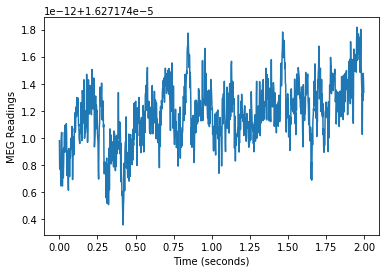

229 MEG Readings for Sensor  ['A244']


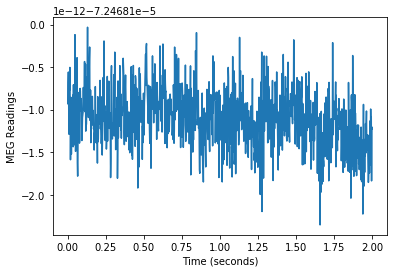

230 MEG Readings for Sensor  ['A185']


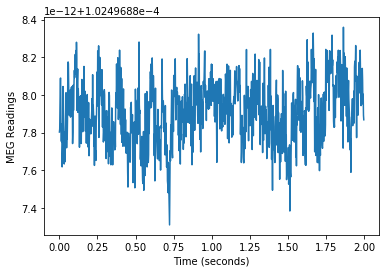

231 MEG Readings for Sensor  ['A162']


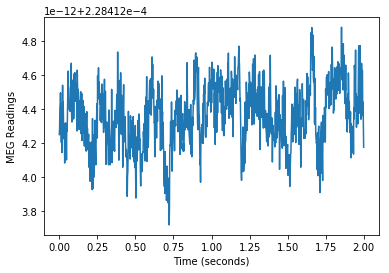

232 MEG Readings for Sensor  ['A106']


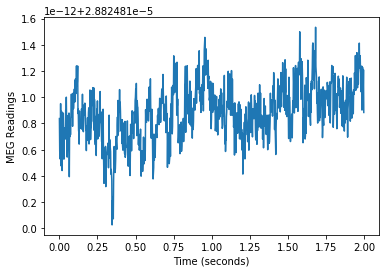

233 MEG Readings for Sensor  ['A187']


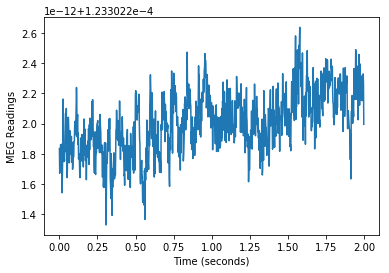

234 MEG Readings for Sensor  ['A48']


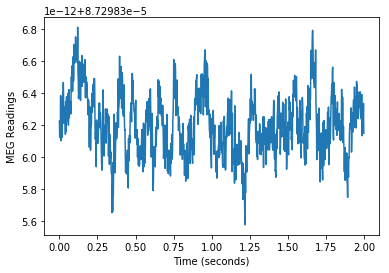

235 MEG Readings for Sensor  ['A221']


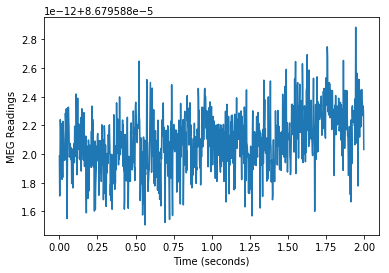

236 MEG Readings for Sensor  ['A196']


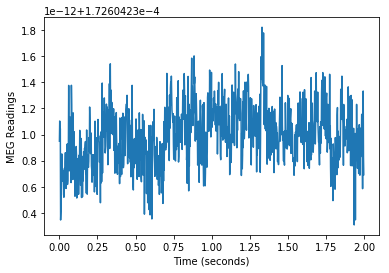

237 MEG Readings for Sensor  ['A133']


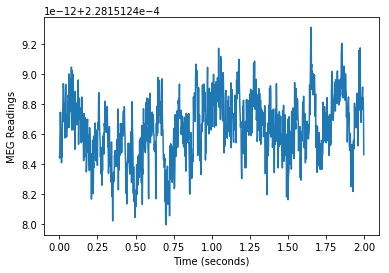

238 MEG Readings for Sensor  ['A158']


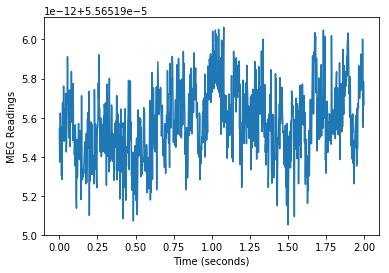

239 MEG Readings for Sensor  ['A44']


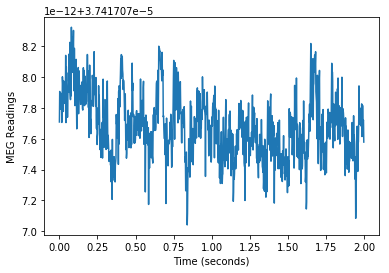

240 MEG Readings for Sensor  ['A134']


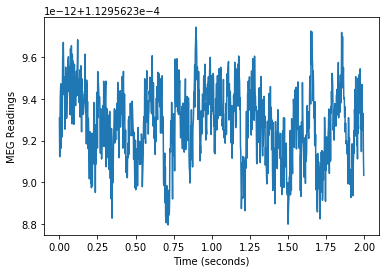

241 MEG Readings for Sensor  ['A216']


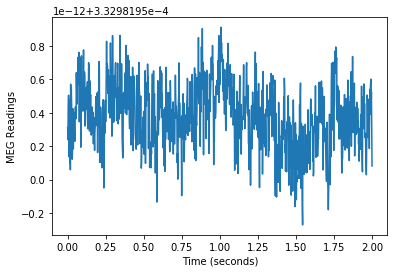

In [83]:
temp = np.zeros(x.shape)
for i in range(x.shape[0]):
    for j in range(len(x[i])):
        temp[i,j] = x[i,j]-np.mean(x[i])/np.std(x[i])
for i in range(len(temp)):
    plt.plot(data_times[0][0][0], temp[i])
    plt.xlabel('Time (seconds)')
    plt.ylabel('MEG Readings')
    print(i+1, "MEG Readings for Sensor ", data_labels[i][0])
    plt.show()